# Library

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 한글 글꼴
plt.rc('font', family='Malgun Gothic')
plt.rc('axes', unicode_minus=False)

# 전처리

In [2]:
# 파일 불러오기
file_path = r"C:\Users\james\J_Data_Lab\Project-DonationPrediction\data\koweps_hp01_18_long_240329.csv"
df = pd.read_csv(file_path)
df.head()

C:\Users\james\AppData\Local\Temp\ipykernel_4124\2663839284.py:3: DtypeWarning: Columns (7,8,9,10,11,12,13,14,15,16,17,18,22,27,28,29,30,41,42,43,53,54,56,57,58,59,60,61,64,66,69,71,75,88,101,102,103,104,105,107,109,111,113,115,117,119,121,123,125,126,130,132,133,136,139,140,141,150,151,152,153,154,155,160,166,167,168,169,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,206,207,208,209,210,211,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,316,317,318,319,320,328,329,330,331,333,334,335,347,414,415,416,421,429,430,431,432,433,446,456,457,458,459,460,461,462,463,464,553,560,561,562) have mixed types. Specify dtype option 

,h_merkey,h_pid,year,wv,wv_num,first_wv,last_wv,p_wsl,p_wsc,p_wgl,...,c05_34,c05_35,c05_37,c05_39,c05_41,c05_43,c05_45,c05_47,c05_49,release_date
0,10101,101,2005,1,8,1,13,0.330436,0.330436,824.362203,...,,,,,,,,,,240329
1,10101,101,2011,7,8,1,13,0.213326,0.206625,727.440896,...,,,,,,,,,,240329
2,10101,101,2012,8,8,1,13,0.275484,0.273357,971.019241,...,,,,,,,,,,240329
3,10101,101,2013,9,8,1,13,0.283128,0.280632,1045.841419,...,,,,,,,,,,240329
4,10101,101,2014,10,8,1,13,0.278869,0.276215,1062.758071,...,,,,,,,,,,240329


In [3]:
df.shape

(289805, 2522)

In [4]:
# 2006년부터의 데이터 필터링
df= df[df['year'] >= 2006]

# 값이 1개만 존재하는 변수(컬럼) 삭제
df = df.loc[:, df.nunique() > 1]

# 개인정보 및 필요없는 변수
columns_to_drop = ['h_merkey', 'year', 'wv', 'wv_num', 'first_wv', 'last_wv', 'h_id', 'h_ind', 'h_sn', 'h_new', 'h_new1'
                  ,'h_pid', 'h_pind', 'p_wsl', 'p_wsc', 'p_wgl', 'p_wgc', 'p_wsl_all', 'p_wsc_all', 
                   'p_wgl_all', 'p_wgc_all', 'p_wsl_n_all', 'p_wsc_n_all', 'p_wgl_n_all', 'p_wgc_n_all']

# 해당 변수들 삭제
df = df.drop(columns=columns_to_drop)

# 공백을 NaN으로 변환
df.replace(['.', ' ', 'None', 'NaN', 'nan'], np.nan, inplace=True)

# p04_5 열은 제외하고 결측치가 50% 이상인 열을 삭제
df = df.loc[:, (df.isnull().mean() < 0.5) | (df.columns == 'p04_5')]

# object 타입 numeric 변환
df= df.apply(pd.to_numeric, errors='coerce')

df.shape

(270949, 316)

In [5]:
# summary table 
def summary(df):
    print(f'data shape: {df.shape}')
    summ = pd.DataFrame(df.dtypes, columns=['data type'])
    summ['#missing'] = df.isnull().sum().values 
    summ['%missing'] = df.isnull().sum().values / len(df)* 100
    summ['#unique'] = df.nunique().values
    desc = pd.DataFrame(df.describe(include='all').transpose())
    summ['min'] = desc['min'].values
    summ['max'] = desc['max'].values
    summ['mean'] = desc['mean'].values
    summ['first quartile'] = desc.loc[:, '25%'].values
    summ['second quartile'] = desc.loc[:, '50%'].values
    summ['third quartile'] = desc.loc[:, '75%'].values
    
    return summ

In [8]:
# 모든 열을 표시할 수 있도록 설정 변경
pd.set_option('display.max_columns', None)  # 모든 열을 표시
pd.set_option('display.max_rows', None)     # 모든 행을 표시

# summary 함수 실행
summary_df = summary(df)
summary_df

data shape: (212247, 317)


,data type,#missing,%missing,#unique,min,max,mean,first quartile,second quartile,third quartile
h_cobf,float64,84331,39.732481,8,0.0,7.0,0.043599,0.0,0.0,0.0
h_reg5,int64,0,0.000000,5,1.0,5.0,2.667717,2.0,3.0,3.0
h_reg7,int64,0,0.000000,7,1.0,7.0,3.687703,2.0,3.0,5.0
h_din,float64,6,0.002827,23993,-232978.0,451181.0,4184.643591,1663.2,3341.0,5707.0
h_cin,float64,6,0.002827,15130,-232174.0,468209.0,4585.397089,1729.0,3562.0,6216.0
h_flag,float64,37902,17.857496,2,0.0,1.0,0.001164,0.0,0.0,0.0
h_hc,float64,37461,17.649719,2,1.0,2.0,1.316536,1.0,1.0,2.0
h01_1,int64,0,0.000000,9,1.0,9.0,2.823960,2.0,3.0,4.0
h01_110,int64,0,0.000000,5,1.0,5.0,4.343619,5.0,5.0,5.0
h_hc_all,float64,66339,31.255565,2,1.0,2.0,1.323430,1.0,1.0,2.0


In [7]:
# 타겟 변수 생성
df['donation'] = ((df['p04_4'] == 1) & (df['p04_5'] >= 1)).astype(int)

# p04_4가 1 또는 2인 경우만 남김
df = df[df['p04_4'].isin([1, 2])]

# p04_4가 1인데 p04_5가 1 이하이거나 결측치인 경우 제거
df = df[~((df['p04_4'] == 1) & ((df['p04_5'] <= 1) | (df['p04_5'].isna())))]


In [13]:
from sklearn.impute import KNNImputer

In [14]:
# 1. 'p04_4'와 'p04_5' 변수 삭제 및 'donation' 변수 제외
#df = df.drop(['p04_4', 'p04_5'], axis=1)
cols = df.columns.drop('donation')

# 2. 변수 분류
categorical_vars = []
continuous_vars = []

for col in cols:
    num_unique = df[col].nunique()
    if num_unique <= 15:
        categorical_vars.append(col)
    else:
        continuous_vars.append(col)

# 3. 이산형 변수의 결측치 최빈값으로 대체
for var in categorical_vars:
    mode = df[var].mode()[0]
    df[var] = df[var].fillna(mode)

In [15]:

# 4. 연속형 변수의 결측치 KNN Imputation으로 대체
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer

# 4.1 표준화
scaler = StandardScaler()
df_continuous = df[continuous_vars]
df_continuous_scaled = pd.DataFrame(scaler.fit_transform(df_continuous), columns=continuous_vars)




In [16]:

# 4.2 KNN Imputer 적용
imputer = KNNImputer(n_neighbors=5)
df_continuous_imputed = pd.DataFrame(imputer.fit_transform(df_continuous_scaled), columns=continuous_vars)


KeyboardInterrupt: 

In [ ]:
# 4.3 역변환
df_continuous_imputed = pd.DataFrame(scaler.inverse_transform(df_continuous_imputed), columns=continuous_vars)

# 4.4 원본 데이터프레임 업데이트
df[continuous_vars] = df_continuous_imputed[continuous_vars]

# 5. 결측치 처리 결과 확인
missing_counts = df.isnull().sum()
print(missing_counts[missing_counts > 0])

In [4]:
corr_matrix = df.corr()

# 상관계수 절대값이 threshold 이상인 변수 찾기 (0.9)
threshold = 0.9
upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# 상관관계가 threshold 이상인 열들을 찾고 제거
to_drop = [column for column in upper_triangle.columns if any(upper_triangle[column].abs() > threshold)]

# 상관관계가 높은 변수들 제거
df = df.drop(columns=to_drop)

# 결과 확인
print("제거된 변수들:", to_drop)

제거된 변수들: ['h_cin', 'h_hc_all', 'h_med1', 'h_eco1', 'h_soc1', 'h_inc1', 'h_inc2_3', 'h_inc3_6', 'h_inc4_7', 'h_inc4_8', 'h_inc7_3', 'h_pers_income4', 'h07_6aq12', 'h07_9', 'h08_aq14', 'h08_aq15', 'h10_aq12', 'h10_aq13', 'h10_aq17', 'h10_aq18', 'p_fnum', 'p02_1', 'p05_3aq11', 'p05_11', 'p05_12', 'p05_14', 'p05_16', 'p05_17', 'p05_18', 'p05_19', 'p05_22', 'p05_28', 'p05_29', 'p05_4aq10', 'p05_4aq11', 'p05_7aq1', 'h08_aq17']


In [5]:
df.shape

(270949, 279)

In [5]:
df = df.drop(columns=['h_g1', 'h_g2', 'h_g8', 'h_g12', 'h08_195', 'h08_3aq8'])

In [7]:
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import zscore

def process_df(df):
    # 먼저 p04_4와 p04_5의 결측치를 0으로 대체
    df['p04_4'] = df['p04_4'].fillna(0)
    df['p04_5'] = df['p04_5'].fillna(0)

    # 유니크 값에 따라 연속형, 이산형 변수로 분리
    discrete_cols = df.columns[df.nunique() < 15]
    continuous_cols = df.columns[df.nunique() >= 15]

    # p04_5는 제외한 연속형 변수 처리
    continuous_cols = continuous_cols.drop('p04_5', errors='ignore')

    # 이산형 변수의 결측치를 최빈값으로 대체
    for col in discrete_cols:
        mode_value = df[col].mode()[0]
        df[col] = df[col].fillna(mode_value)
    
    # 연속형 변수: 미니맥스 스케일링 후, 정규화 및 중앙값으로 결측값 대체
    scaler = MinMaxScaler()
    df[continuous_cols] = scaler.fit_transform(df[continuous_cols])
    
    # 연속형 변수의 결측치를 중앙값으로 대체
    for col in continuous_cols:
        median_value = df[col].median()
        df[col] = df[col].fillna(median_value)  # 결측치를 중앙값으로 대체
    
    return df



In [15]:
# 유니크 값이 2개 또는 3개인 변수에 대해 원핫 인코딩 수행
for col in df.columns:
    unique_values = np.unique(df[col].dropna())  # NaN 값 제거
    if len(unique_values) == 2 or len(unique_values) == 3:
        # 최빈값을 1로, 나머지 값 중 하나는 0으로 변환
        mode_value = df[col].mode()[0]  # 최빈값 구하기
        df[col] = df[col].apply(lambda x: 1 if x == mode_value else 0)

In [8]:
df = process_df(df)

In [20]:
df.to_csv(r"C:\Users\james\J_Data_Lab\Project-DonationPrediction\data\koweps_1010.csv", index=False)

In [18]:
# 변수명이 0인 컬럼을 제거
df = df.loc[:, df.columns != 0]

In [21]:
#평균이 1.0에 매우 가깝고 사분위수가 모두 1.0
df = df.drop(columns=['h_flag', 'h_inc6_1', 'h06_36', 'h06_39', 'h06_33', 'h13_8aq2','h13_22','h11_4','h11_6','h13_4aq16','h06_14','h06_27'])

In [24]:
# 평균과 중앙값의 비율을 계산하여 기준 이상인 변수 식별
numerical_vars = df.select_dtypes(include=[np.number]).columns.tolist()

log_transform_vars = []
for col in numerical_vars:
    mean = df[col].mean()
    median = df[col].median()
    if median != 0 and (mean / median > 2 or median / mean > 2):
        log_transform_vars.append(col)

# 로그 변환 (0 이하의 값은 변환 전에 작은 양의 값 추가)
for col in log_transform_vars:
    df[col] = df[col] + 1e-6  # 0 값 처리
    df[col] = np.log(df[col])


In [25]:
# 사분위수가 모두 0인 변수 식별
sparse_vars = []
for col in numerical_vars:
    if df[col].quantile(0.25) == 0 and df[col].quantile(0.5) == 0 and df[col].quantile(0.75) == 0:
        sparse_vars.append(col)

# 해당 변수 제거
df.drop(columns=sparse_vars, inplace=True)


In [28]:
from scipy import stats
# 수치형 변수 목록에서 `p04_5` 제거
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
if 'p04_5' in numeric_cols:
    numeric_cols.remove('p04_5')

# Z-스코어 계산 및 임계값 설정 (예: 절대값이 3보다 큰 경우 이상치로 간주)
z_scores = np.abs(stats.zscore(df[numeric_cols]))
df = df[(z_scores < 3).all(axis=1)]


In [30]:
# 순서형 변수 목록과 카테고리 정의
ordinal_vars = {
    'h_reg5': [1, 2, 3, 4, 5],
    'h_reg7': [1, 2, 3, 4, 5, 6, 7],
    'h_g6': [1, 2, 3, 4, 5, 6, 7, 8, 9]
}

for var, categories in ordinal_vars.items():
    if var in df.columns:
        df[var] = df[var].astype('category')
        df[var] = df[var].cat.set_categories(categories, ordered=True)


In [16]:
# 엑셀 파일 불러오기

excel_file_path = r"C:\Users\james\J_Data_Lab\Project-DonationPrediction\data\\999.xlsx"
excel_data = pd.read_excel(excel_file_path)

# 엑셀 파일에서 첫 번째 행에 있는 변수명 추출 (변수명: 영어, 설명: 한국어)
new_column_names = excel_data.iloc[0]  # 첫 번째 행에 변수명이 있다고 가정
excel_variable_mapping = dict(zip(new_column_names.index, new_column_names.values))


# 기존 CSV 파일의 변수명 확인
old_column_names = df.columns.tolist()

# 엑셀 파일에서 동일한 변수명이 있는 경우에만 변수명 변경
updated_column_names = [excel_variable_mapping[col] if col in excel_variable_mapping else col for col in old_column_names]

# 변경된 변수명을 데이터프레임에 적용
df.columns = updated_column_names
df.head()

,분가사유,5개 권역별 지역구분,7개 권역별 지역구분,가처분소득,가처분소득 및 경상소득 -Imputation 여부 (무응답 대체법 적용 여부),균등화소득에 따른 가구구분 (공공부조 이전의 균등화 경상소득의 중위 60% 기준)(원표본),가구원수,가구형태,가구원 번호,가구주와의 관계,성별,태어난 연도,교육수준1,교육수준2,장애종류,장애등급(정도),혼인상태,종교(15차에서 일시 삭제),동거여부,건강상태,1년간 의료기관 이용 외래진료횟수,입원횟수,입원일수,병원에 입원한 이유,주로 이용하는 의료기관 형태,건강검진 횟수,만성질환,민간의료보험 가입건수,근로 능력 정도,주된 경제활동 참여상태,공적연금가입형태,산재보험가입여부,고용보험가입여부,퇴직금 적용여부,퇴직연금 가입여부,개인연금 가입여부,건강보험 가입여부,상용근로자 해당여부,임시일용근로자 해당여부,고용주자영자 해당여부,농림축산업 경영주 해당여부,어업 경영주 해당여부,무급가족종사자 기타 해당여부,연간 기타 근로소득,건강보험 가입여부,가입자의 해당종류,건강보험료 미납경험,건강보험 문제점,민간의료보험의 12월 기준 보험료,지난 1년간 이사경험 여부,주택유형,주거위치,방수,주거면적,집의 (등기상) 점유형태,집의 가격,"주택구입비용, 보증금 마련 경로(1순위)","주택구입비용, 보증금 마련 경로(2순위)",1년간 총 원금상환액(가),12월 31일 기준 주택관련 부채액(나),1년간 대출상환액 연체횟수,"주택의 구조, 성능 및 환경(가)","주택의 구조, 성능 및 환경(나)","주택의 구조, 성능 및 환경(다)","주택의 구조, 성능 및 환경(라)",주거시설 사용형태_상하수도,주거시설 사용형태_부엌,주거시설 사용형태_화장실,주거시설 사용형태_목욕시설,주거시설 사용형태_난방시설,(가)주거복지사업 이용경험_공공임대주택,(나)주거복지사업 이용경험_전세자금(융자)지원,(다)주거복지사업 이용경험_월세지원,(라)주거복지사업 이용경험_주택구입자금(융자)지원,식료품비-가정식비,식료품비-외식비,식료품비-주류ㆍ담배비,h07_3aq3,주거비-주거관리비,광열수도비,광열수도비-난방비,가구가사용품비-가구집기ㆍ가사용품비,가구가사용품비-보육료비,피복신발비,보건의료비,교육비-공교육비,교육비-사교육비,교양오락비,교통비,통신비,기타소비지출,기타소비-경조비,기타소비-종교관련비(십일조),비동거가구원에게 보낸 월평균 송금보조비,부모에게 보낸 월평균 송금보조비,자녀에게 보낸 월평균 송금보조비,기타 가구원이 아닌 부모‧자녀‧친지에게 보낸 월평균 송금보조비,세금,세금-소득세,세금-재산세,세금-자동차세,세금-종합소득세,세금-부동산세,사회보장부담금,사회보장부담-건강보험료,h07_6aq14,h08_106,임시‧일용근로자 수 합계,고용주‧자영자 수 합계,농림‧축산업 경영주 수 합계,어업 경영주 수 합계,무급가족종사자‧가사 또는 육아‧학생‧기타 수 합계,"이자, 배당금 연간소득",임대료 연간소득,기타(자격증 대여 등) 연간소득,공적연금 연간소득,고용보험 연간소득,h08_6aq1,"장애수당(장애인 연금, 경증장애수당) \n또는 장애아동수당",h08_10aq1,한부모가족지원,가정위탁금 또는 소년소녀가장보호비,양육수당(영유아 양육지원),"보육료 지원(i-사랑 카드, 아이즐거운 카드)",학비지원(농림부지원 포함),국가유공자에 대한 보조금(보훈급여 포함),농어업 정부보조금,긴급복지지원금,바우처지원금,근로장려세제,급식비 지원,"에너지 감면 또는 보조(전기료, 가스비 등)","통신 감면 또는 보조(전화비, 인터넷 등)",기타 보조금,증여‧상속,경조금,보상금,사고보험금,"퇴직금, 사회보험 일시금, 보장성 보험 해약금",동산ㆍ부동산 매매차익,기타 소득,세금환급금,가구원이 아닌 부모로부터의 보조금(현금 및 현물),가구원이 아닌 자녀로부터의 보조금(현금 및 현물),9개월 미만 생계를 같이 하다가 분가한 가구원이 함께 살 때 제공한 보조금(현금 및 현물),가구원으로 새로 들어온지 9개월 미만된 가구원이 제공한 보조금(현금 및 현물),민간 개인 또는 단체로 부터 받은 보조금(현금 및 현물),금융기관대출,일반사채,카드빚,전세보증금(받은돈),"외상, 미리탄곗돈",기타부채,주거관련 부채의 이자,기타이자,소유부동산-주택,소유부동산-주택외 건물,소유부동산-토지,점유부동산-전세보증금 준 것,점유부동산-기타(권리금 등),금융자산-예금,금융자산-적금,금융자산-주식ㆍ채권,금융자산-계돈(타기 전),금융자산-기타,농기계-동력탈곡기,농기계-트랙터,농기계-기타 농기계,농축산물-소,농축산물-재고농산물,농축산물-기타 농축산물,자동차-소유한 비영업용 자동차 대수,자동차-소유한 자동차의 가격,기타재산-운동클럽 등의 회원권,기타재산-운송 및 생계수단 차량,"기타재산-귀금속, 골동품, 상품권 등",기타재산-기타,2달이상 집세가 밀리거나 낼수 없어 집을 옮긴 경험,공과금을 기한내 납부하지 못한 경험,"세금을 내지 못해 전기,전화,수도가 끊긴 경험",자녀의 공교육비를 한달이상못준 경험,돈이없어 겨울에 난방을 못한 경험,돈이없어 본인이나 가족이 병원에 못간 경험,가구원중 신용불량자가 된 경험자 여부,건강보험 미납으로 인하여 보험 급여자격을 정지당한 경험여부,경제적인 어려움 때문에 먹을 것이 떨어졌는데도 더 살 돈이 없었던 경험,경제적인 어려움 때문에 먹을 것을 살 돈이 없어서 균형 잡힌 식사를 할 수가 없었던 경험,경제적인 어려움 때문에 먹을 것을 충분히 살 수 없어서 가구 내 성인들이 식사의 양을 줄이거나 실사를 거른 경험,경제적인 어려움 때문에 먹을 것을 충분히 살 수 없어서 먹어야 한다고 생각하는 양보다 적게 드신 경험,경제적인 어려움 때문에 먹을 것을 살 돈이 없어서 배가 고픈데도 먹지 못한 경험,근로장려세제에 대한 인식\n*11-13차: 신규가구만 조사,근로(자녀)장려금 신청 여부\n*5-10차: 근로장려세제 신청 여부,근로(자녀)장려금 수급 요건 충족 여부에 대한 인식\n*4-10차: 근로장려세제 수급 요건 충족 여부에 대한 인식,(가) 생계비 지원 경험여부,(나) 의료비 지원 경험여부,NaN,(라) 가정봉사서비스 경험여부,(마) 식사배달서비스 경험여부,(바) 주택관련서비스 경험여부,"(사) 직업훈련, 취업상담, 취업알선, 자활근로 경험여부",(아) 상담서비스 경험여부,(자) 생계 등을 위한 대출 경험여부,(차) 개인발달계좌(자산형성프로그램) 경험여부,1년간 바우처서비스 이용 경험,장기요양보험급여를 받은 가구원이 있는지,1년간 근심이나 갈등을 초래한 문제(1순위),1년간 근심이나 갈등을 초래한 문제(2순위),(가) 가족원간 의견충돌이 잦은 경우,(나) 가족원간 화가 나서 물건을 집어 던지는 경우,(다) 가족원간 침착하게 문제를 논의하는 경우,(라) 가족원간 자주 서로 비난하는 경우,(마) 가족원간 가끔 때리는 경우,유형 3과 유형 4 설문지 대상자 구분변수,최종조사결과 확인,공적연금 수급여부,고용보험 급여 수급여부,산재보험 급여 수급여부,개인연금 수급여부,"퇴직금, 퇴직보험 수급여부",공공근로-경험여부,노인일자리-경험여부,자활공동체 및 자활근로-경험여부,사회적기업 육성서비스\n(사회적 일자리)-경험여부,직장체험연수-경험여부,미취업자 직업훈련-경험여부,창업지원-경험여부,희망근로-경험여부,청년 인턴쉽제도-경험여부,취업자 능력 개발 훈련-경험여부,기타-경험여부,새로운 기술 습득(1순위),인터넷사용 여부,유해환경에서 일한 경험,건강 만족도,가족의 수입 만족도,주거 환경 만족도,가족관계 만족도,직업 만족도,사회적 친분관계 만족도,여가생활 만족도,전반적 만족도,자원봉사활동 여부,연간 기부 총액,비동거 부모님이 계신지 여부,현재 담배를 피우는지 여부,실내공간에서 하루 타인의 담배연기를 맡은 시간정도,1년간 평균 음주량,(가) 식욕이 없음,(나) 비교적 잘 지냈다,(마) 잠을 설침,(사) 불만없이 생활,(가) 나는 가치있는 사람이다,(나) 나는 좋은 성품을 지녔다,(라) 다른 사람들과 같이 일을 잘할수 있다,(마) 자랑할 것이 별로 없다,(바) 긍정적인 태도를 가졌다,(사) 대체로 만족,(아) 내 자신을 존경할수 있으면 좋겠다,"(가) 모욕적, 악의적인 이야기 경험",가족생활에 대한 만족도,배우자와의 관계에 대한 만족도,자녀와의 관계에 대한 만족도,자녀들의 형제자매 관계에 대한 만족도,주요병명,주거복지사업 이용경험

In [15]:
pip install openpyxl


Note: you may need to restart the kernel to use updated packages.


In [59]:
for col in df.columns:
    unique_values = np.unique(df[col].dropna())  # NaN 값 제거
    if len(unique_values) == 7:
        print(f"변수 '{col}'의 유니크 값 7개: {unique_values}")

변수 'h_g7'의 유니크 값 7개: [0 1 2 3 4 5 9]
변수 'h06_3'의 유니크 값 7개: [1 2 3 4 5 6 9]
변수 'h06_8'의 유니크 값 7개: [0. 1. 2. 3. 4. 5. 9.]
변수 'h08_107'의 유니크 값 7개: [0. 1. 2. 3. 4. 5. 6.]
변수 'h08_111'의 유니크 값 7개: [0. 1. 2. 3. 4. 5. 6.]
변수 'h17_3'의 유니크 값 7개: [0 1 2 3 4 5 9]
변수 'h17_4'의 유니크 값 7개: [0 1 2 3 4 5 9]
변수 'h17_5'의 유니크 값 7개: [0 1 2 3 4 5 9]
변수 'h17_6'의 유니크 값 7개: [0 1 2 3 4 5 9]
변수 'h17_7'의 유니크 값 7개: [0 1 2 3 4 5 9]


In [7]:
# 유니크 값이 2개 또는 3개인 변수에 대해 원핫 인코딩 수행
for col in df.columns:
    unique_values = np.unique(df[col].dropna())  # NaN 값 제거
    if len(unique_values) == 2 or len(unique_values) == 3:
        # 최빈값을 1로, 나머지 값 중 하나는 0으로 변환
        mode_value = df[col].mode()[0]  # 최빈값 구하기
        df[col] = df[col].apply(lambda x: 1 if x == mode_value else 0)

In [8]:
# 'h13_4aq15' 변수 드랍
df = df.drop(columns=['h13_4aq15'])

In [9]:
df = df.drop(columns=['p01_1'])

In [10]:
df = df.drop(columns=['h12_1_4aq1', 'h12_1_5aq1'])

In [11]:
# 적용할 변수 목록
columns_to_encode = ['h06_aq1', 'h06_21', 'h11_2', 'h11_5', 'h11_3aq4', 
                     'h11_3aq7', 'p01_15', 'p01_20', 'p01_27', 'p01_31', 
                     'p03_2', 'p05_3aq9', 'p05_3aq11','h11_3aq2']

# 각 변수에 대해 원핫 인코딩 적용 (최빈값은 1, 그외는 0)
for col in columns_to_encode:
    mode_value = df[col].mode()[0]  # 최빈값 구하기
    df[col] = df[col].apply(lambda x: 1 if x == mode_value else 0)

In [30]:
# '변수의 유니크 값별 빈도수 확인
unique_counts = df['p05_20'].value_counts()

# 결과 출력
print(unique_counts)


p05_20
0.75    104176
0.00     62865
0.50     55048
1.00     34358
0.25     14502
Name: count, dtype: int64


In [12]:
# 새로 추가할 열을 모두 한 번에 처리
new_columns = pd.DataFrame({
    'seoul': df['h_reg5'].apply(lambda x: 1 if x == 1 else 0),
    'metropolitan': df['h_reg5'].apply(lambda x: 1 if x == 2 else 0),
    'city': df['h_reg5'].apply(lambda x: 1 if x == 3 else 0),
    'county': df['h_reg5'].apply(lambda x: 1 if x == 4 else 0),
    'urban': df['h_reg5'].apply(lambda x: 1 if x == 5 else 0)
})

# 기존 DataFrame과 결합
df = pd.concat([df, new_columns], axis=1)

In [13]:
df = df.drop(columns=['h_reg5'])

In [14]:
df = df.drop(columns=['h_reg7'])

In [15]:
# 'h01_110' 값에 따라 원핫 인코딩을 진행하고, 변수명 지정
new_columns_h01_110 = pd.DataFrame({
    'single': df['h01_110'].apply(lambda x: 1 if x == 1 else 0),
    'mother_child': df['h01_110'].apply(lambda x: 1 if x == 2 else 0),
    'father_child': df['h01_110'].apply(lambda x: 1 if x == 3 else 0),
    'grandparent_child': df['h01_110'].apply(lambda x: 1 if x == 4 else 0),
    'other(child)': df['h01_110'].apply(lambda x: 1 if x == 5 else 0)
})

# 새로운 열을 기존 데이터프레임에 결합
df = pd.concat([df, new_columns_h01_110], axis=1)

# 'h01_110' 변수 삭제
df = df.drop(columns=['h01_110'])


In [16]:
# 'h06_2' 값에 따라 원핫 인코딩을 진행하고, 변수명 지정
new_columns_h06_2 = pd.DataFrame({
    'basement': df['h06_2'].apply(lambda x: 1 if x == 1 else 0),
    'semi_basement': df['h06_2'].apply(lambda x: 1 if x == 2 else 0),
    'above_ground': df['h06_2'].apply(lambda x: 1 if x == 3 else 0),
    'rooftop': df['h06_2'].apply(lambda x: 1 if x == 4 else 0),
    'other(house)': df['h06_2'].apply(lambda x: 1 if x == 9 else 0)
})

# 새로운 열을 기존 데이터프레임에 결합
df = pd.concat([df, new_columns_h06_2], axis=1)

# 'h06_2' 변수 삭제
df = df.drop(columns=['h06_2'])

In [17]:
# 적용할 변수 목록
columns_to_encode = ['h_soc9', 'h_soc11', 'h_soc10']

# 각 변수에 대해 원핫 인코딩 수행 (최빈값은 1, 그외는 0)
for col in columns_to_encode:
    mode_value = df[col].mode()[0]  # 최빈값 구하기
    df[col] = df[col].apply(lambda x: 1 if x == mode_value else 0)

In [18]:
df = df.drop(columns=['h_g9_1'])

In [19]:
# 9와 결측값을 1로 대체
df['h06_10'] = df['h06_10'].replace(9, 1).fillna(1)

# 'h06_10' 값에 따라 원핫 인코딩을 진행하고, 변수명 지정
new_columns_h06_10 = pd.DataFrame({
    'no_overdue': df['h06_10'].apply(lambda x: 1 if x == 1 else 0),
    'once_overdue': df['h06_10'].apply(lambda x: 1 if x == 2 else 0),
    'two_to_three_overdue': df['h06_10'].apply(lambda x: 1 if x == 3 else 0),
    'four_or_more_overdue': df['h06_10'].apply(lambda x: 1 if x == 4 else 0)
})

# 새로운 열을 기존 데이터프레임에 결합
df = pd.concat([df, new_columns_h06_10], axis=1)

df = df.drop(columns=['h06_10'])

In [25]:
# 결측치를 최빈값으로 대체
mode_value = df['h05_7'].mode()[0]
df['h05_7'] = df['h05_7'].fillna(mode_value)

# 최빈값 0은 0으로, 나머지는 1로 변환
df['h05_7_encoded'] = df['h05_7'].apply(lambda x: 0 if x == mode_value else 1)

In [33]:
df = df.drop(columns=['h05_7'])

In [27]:
df['h11_3aq3'] = df['h11_3aq3'].apply(lambda x: 1 if x == 1 else 
                                                          0.5 if x == 2 else 
                                                          0 if x in [3, 4, 9] else 
                                                          0)

In [28]:
# 처리할 변수 목록
columns_to_process = ['p05_9', 'p05_10', 'p05_11', 'p05_12', 'p05_13', 
                      'p05_14', 'p05_15', 'p05_16', 'p05_17', 'p05_18', 'p05_19']

# 각 변수에 대해 결측치와 9는 0으로, 1은 0.25, 2는 0.5, 3은 0.75, 4는 1로 처리
for col in columns_to_process:
    df[col] = df[col].apply(lambda x: 0 if pd.isna(x) or x == 9 else 
                                      0.25 if x == 1 else 
                                      0.5 if x == 2 else 
                                      0.75 if x == 3 else 
                                      1 if x == 4 else 0)

In [29]:
# 처리할 변수 목록
columns_to_process = ['p05_20', 'p05_21', 'p05_22', 'p05_23', 'p05_24', 
                      'p05_25', 'p05_26', 'p05_27', 'p05_28', 'p05_29']

# 각 변수에 대해 결측치와 9는 0으로, 1은 0.25, 2는 0.5, 3은 0.75, 4는 1로 처리
for col in columns_to_process:
    df[col] = df[col].apply(lambda x: 0 if pd.isna(x) or x == 9 else 
                                      0.25 if x == 1 else 
                                      0.5 if x == 2 else 
                                      0.75 if x == 3 else 
                                      1 if x == 4 else 0)

In [36]:
# 드랍할 변수 목록
columns_to_drop = ['p04_3aq1', 'p04_3aq2', 'p04_3aq3', 'p04_3aq4', 
                   'p04_3aq5', 'p04_3aq6', 'p04_3aq7', 'p04_3aq8']

# 변수 드랍
df = df.drop(columns=columns_to_drop)

In [63]:
df.to_csv(r"C:\Users\james\J_Data_Lab\Project-DonationPrediction\data\koweps_checkpoint2.csv", index=False)

In [62]:
# '변수의 유니크 값별 빈도수 확인
unique_counts = df['p04_5'].value_counts()

# 결과 출력
print(unique_counts)


p04_5
0.00        4609
12.00       2567
24.00       1657
36.00       1496
6.00         876
10.00        713
60.00        647
30.00        501
20.00        499
1.00         425
120.00       375
50.00        348
5.00         339
100.00       318
18.00        280
48.00        277
2.00         276
4.00         228
3.00         220
72.00        182
40.00        167
15.00        158
200.00       116
25.00         80
84.00         74
9.00          74
150.00        73
8.00          71
42.00         67
300.00        65
240.00        65
7.00          63
80.00         63
96.00         60
180.00        54
54.00         53
70.00         52
14.00         47
16.00         44
108.00        42
500.00        39
13.00         37
35.00         30
400.00        27
99999.00      26
360.00        26
144.00        26
26.00         25
250.00        25
132.00        24
90.00         23
22.00         23
3.60          21
600.00        19
130.00        19
66.00         18
34.00         17
44.00         16
156.00  

In [41]:
# 'h12_1_4aq2' 변수 드랍
df = df.drop(columns=['h12_1_4aq2'])

In [42]:
# 처리할 변수 목록
columns_to_process = ['p03_5', 'p03_6', 'p03_7', 'p03_8', 'p03_9', 
                      'p03_10', 'p03_11', 'p03_12']

# 각 변수에 대해 1은 0, 2는 0.2, 3은 0.4, 4는 0.6, 5는 0.8로 변환하고, 결측치와 9는 0으로 대체
for col in columns_to_process:
    df[col] = df[col].apply(lambda x: 0 if pd.isna(x) or x == 9 else 
                                      0 if x == 1 else 
                                      0.2 if x == 2 else 
                                      0.4 if x == 3 else 
                                      0.6 if x == 4 else 
                                      0.8 if x == 5 else 0)

In [43]:
# 결측값을 최빈값으로 대체
mode_value = df['p05_2'].mode()[0]
df['p05_2'] = df['p05_2'].fillna(mode_value)

# 새로운 이진 변수 생성
df['drink_month_1'] = df['p05_2'].apply(lambda x: 1 if x == 1 else 0)
df['drink_month_2_4'] = df['p05_2'].apply(lambda x: 1 if x == 2 else 0)
df['drink_week_2_3'] = df['p05_2'].apply(lambda x: 1 if x == 3 else 0)
df['drink_week_4'] = df['p05_2'].apply(lambda x: 1 if x == 4 else 0)
df['drink_never'] = df['p05_2'].apply(lambda x: 1 if x == 5 else 0)

df = df.drop(columns=['p05_2'])

In [44]:
# 드랍할 변수 목록
columns_to_drop = ['drink_month_1', 'drink_month_2_4', 'drink_week_2_3', 'drink_week_4', 'drink_never']

# 변수 드랍
df = df.drop(columns=columns_to_drop)

# 2차,3차의 경우 , 값이 다름

In [45]:
# 처리할 변수 목록
columns_to_process = ['p05_4aq9', 'p05_4aq10', 'p05_4aq11']

# 각 변수의 결측치를 0으로 대체
for col in columns_to_process:
    df[col] = df[col].fillna(0)

In [46]:
df = df.drop(columns=['h12_7'])

In [47]:
# 변수 'h08_106'의 결측치를 0으로 대체
df['h08_106'] = df['h08_106'].fillna(0)

In [48]:
# 처리할 변수 목록
columns_to_fill_mode = ['h_med2', 'h_eco2', 'h_soc_2', 'h_soc8', 'h_soc_12']

# 각 변수의 결측치를 최빈값으로 대체
for col in columns_to_fill_mode:
    mode_value = df[col].mode()[0]  # 최빈값 구하기
    df[col] = df[col].fillna(mode_value)

In [49]:
# 처리할 변수 목록
columns_to_process = ['h06_22', 'h06_23', 'h06_24']

# 결측치를 최빈값으로 대체하고, 9를 5로 대체
for col in columns_to_process:
    mode_value = df[col].mode()[0]
    df[col] = df[col].fillna(mode_value)
    df[col] = df[col].replace(9, 5)

# 원핫 인코딩 진행
df['kitchen_standalone'] = df['h06_22'].apply(lambda x: 1 if x == 1 else 0)
df['kitchen_traditional'] = df['h06_22'].apply(lambda x: 1 if x == 2 else 0)
df['kitchen_shared_standalone'] = df['h06_22'].apply(lambda x: 1 if x == 3 else 0)
df['kitchen_shared_traditional'] = df['h06_22'].apply(lambda x: 1 if x == 4 else 0)
df['kitchen_none'] = df['h06_22'].apply(lambda x: 1 if x == 5 else 0)

df['toilet_standalone_flush'] = df['h06_23'].apply(lambda x: 1 if x == 1 else 0)
df['toilet_standalone_traditional'] = df['h06_23'].apply(lambda x: 1 if x == 2 else 0)
df['toilet_shared_flush'] = df['h06_23'].apply(lambda x: 1 if x == 3 else 0)
df['toilet_shared_traditional'] = df['h06_23'].apply(lambda x: 1 if x == 4 else 0)
df['toilet_none'] = df['h06_23'].apply(lambda x: 1 if x == 5 else 0)

df['bath_standalone_hot'] = df['h06_24'].apply(lambda x: 1 if x == 1 else 0)
df['bath_standalone_no_hot'] = df['h06_24'].apply(lambda x: 1 if x == 2 else 0)
df['bath_shared_hot'] = df['h06_24'].apply(lambda x: 1 if x == 3 else 0)
df['bath_shared_no_hot'] = df['h06_24'].apply(lambda x: 1 if x == 4 else 0)
df['bath_none'] = df['h06_24'].apply(lambda x: 1 if x == 5 else 0)

In [51]:
# 결측치를 최빈값으로 대체
mode_value = df['p02_1'].mode()[0]
df['p02_1'] = df['p02_1'].fillna(mode_value)

# 원핫 인코딩 진행
df['employee'] = df['p02_1'].apply(lambda x: 1 if x == 1 else 0)
df['self_employed'] = df['p02_1'].apply(lambda x: 1 if x == 2 else 0)
df['unpaid_family_worker'] = df['p02_1'].apply(lambda x: 1 if x == 3 else 0)
df['unemployed_able'] = df['p02_1'].apply(lambda x: 1 if x == 4 else 0)
df['unemployed_unable'] = df['p02_1'].apply(lambda x: 1 if x == 5 else 0)

In [54]:
df = df.drop(columns=['p02_1'])

In [52]:
# 처리할 변수 목록
columns_to_process = ['p05_4aq9', 'p05_4aq10', 'p05_4aq11']

# 결측치를 0으로 대체하고, 0과 1은 0으로, 2는 0.33, 3은 0.66, 4는 1로 변환
for col in columns_to_process:
    df[col] = df[col].fillna(0)
    df[col] = df[col].apply(lambda x: 0 if x in [0, 1] else 
                                      0.33 if x == 2 else 
                                      0.66 if x == 3 else 
                                      1 if x == 4 else 0)

In [65]:
df.head()

,h_cobf,h_din,h_cin,h_flag,h_hc,h01_1,h_hc_all,h_g1,h_g2,h_g3,h_g4,h_g6,h_g7,h_g8,h_g9,h_g10,h_g11,h_g12,h_med1,h_med2,h_med3,h_med4,h_med5,h_med6,h_med7,h_med8,h_med10,h_eco1,h_eco2,h_eco4,h_soc1,h_soc_2,h_soc8,h_soc9,h_soc11,h_soc10,h_soc_12,h_soc_13,h_inc1,h_inc2_1,h_inc3_1,h_inc4_1,h_inc5_1,h_inc6_1,h_inc7_1,h_inc2_3,h_inc3_6,h_inc4_7,h_inc4_8,h_inc7_3,h_inc7,h_pers_income4,h05_1,h05_3aq1,h05_4,h05_3aq2,h06_aq1,h06_1,h06_4,h06_5,h06_3,h06_6,h06_8,h06_9,h06_aq2,h06_aq3,h06_11,h06_12,h06_13,h06_14,h06_21,h06_22,h06_23,h06_24,h06_25,h06_27,h06_33,h06_36,h06_39,h07_3aq1,h07_3aq2,h07_5aq1,h07_3aq3,h07_3aq4,h07_3aq5,h07_6aq1,h07_3aq6,h07_5aq2,h07_3aq7,h07_3aq8,h07_3aq9,h07_3aq10,h07_3aq11,h07_5aq3,h07_5aq4,h07_3aq13,h07_6aq4,h07_6aq6,h07_3aq14,h07_3aq15,h07_3aq16,h07_3aq17,h07_4,h07_6aq7,h07_6aq8,h07_6aq9,h07_6aq10,h07_6aq11,h07_5,h07_6aq12,h07_6aq13,h07_6aq14,h07_9,h08_106,h08_107,h08_108,h08_109,h08_110,h08_111,h08_aq9,h08_aq10,h08_aq11,h08_aq12,h08_aq13,h08_aq14,h08_aq15,h08_6aq1,h08_aq16,h08_10aq1,h08_aq19,h08_aq20,h08_aq21,h08_5aq3,h08_aq22,h08_aq23,h08_aq24,h08_4aq116,h08_4aq117,h08_5aq1,h08_7aq4,h08_7aq6,h08_7aq8,h08_aq25,h08_aq26,h08_aq27,h08_aq28,h08_aq29,h08_3aq5,h08_4aq118,h08_aq30,h08_6aq3,h08_3aq6,h08_3aq7,h08_aq32,h08_aq33,h08_aq34,h09_aq1,h09_aq2,h09_aq3,h09_aq4,h09_aq5,h09_aq6,h09_aq7,h09_aq8,h10_aq1,h10_aq2,h10_aq3,h10_aq4,h10_aq5,h10_aq6,h10_aq7,h10_aq8,h10_aq9,h10_aq10,h10_aq11,h10_aq12,h10_aq13,h10_aq14,h10_aq15,h10_aq16,h10_aq17,h10_aq18,h10_aq19,h10_aq20,h10_26,h10_27,h10_aq23,h10_aq24,h10_aq25,h10_aq26,h11_2,h11_3,h11_4,h11_5,h11_6,h11_7,h11_8,h11_3aq1,h11_3aq2,h11_3aq3,h11_3aq4,h11_3aq6,h11_3aq7,h13_2,h13_6,h13_10,h13_14,h13_18,h13_22,h13_26,h13_8aq1,h13_5aq1,h13_8aq2,h13_4aq1,h13_4aq16,h17_1,h17_2,h17_3,h17_4,h17_5,h17_6,h17_7,p_fnum,p_tq,p_cp,p01_15,p01_20,p01_27,p01_31,p02_8aq5,p02_8aq6,p02_8aq7,p02_8aq8,p02_8aq9,p02_8aq10,p02_8aq11,p02_8aq12,p02_8aq13,p02_8aq14,p02_8aq15,p02_aq2,p03_1,p03_2,p03_5,p03_6,p03_7,p03_8,p03_9,p03_10,p03_11,p03_12,p04_4,p04_5,p04_7,p05_3aq5,p05_3aq9,p05_3aq11,p05_9,p05_10,p05_11,p05_12,p05_13,p05_14,p05_15,p05_16,p05_17,p05_18,p05_19,p05_20,p05_21,p05_22,p05_23,p05_24,p05_25,p05_26,p05_27,p05_28,p05_29,p05_4aq9,p05_4aq10,p05_4aq11,p05_aq1,p05_aq2,p05_aq3,p05_aq4,p05_7aq1,h_med9,h06_30,h06_3aq1,h09_9,h08_3aq8,h08_195,h12_1,h08_aq17,seoul,metropolitan,city,county,urban,single,mother_child,father_child,grandparent_child,other(child),basement,semi_basement,above_ground,rooftop,other(house),no_overdue,once_overdue,two_to_three_overdue,four_or_more_overdue,h05_7_encoded,kitchen_standalone,kitchen_traditional,kitchen_shared_standalone,kitchen_shared_traditional,kitchen_none,toilet_standalone_flush,toilet_standalone_traditional,toilet_shared_flush,toilet_shared_traditional,toilet_none,bath_standalone_hot,bath_standalone_no_hot,bath_shared_hot,bath_shared_no_hot,bath_none,employee,self_employed,unpaid_family_worker,unemployed_able,unemployed_unable
1,0.0,858.8,896.0,0,0,1,0,1,10,1,1936,2,0,0,0,2,1,1.0,1,3,100.0,0,0.0,0,2,1.0,0.0,1,2,9.0,1,0,0,1,1,1,4,3.0,1.0,1,1,1,1,1,1,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1,0,1,0.0,1,2,2,40.0,2,5000.0,1.0,2.0,0.0,0.0,0,0,1,1,1,1,1,1,5,1,1,1,1,22.0,1.0,0.0,0.0,1.0,7.0,4.4,2.0,0.0,0.8,14.0,0.0,0.0,7.0,2.0,3.0,10.0,0.7,0.0,0.0,0.0,0.0,0.0,0.1,0.0,0.0,0.0,0.0,0.0,3.0,0.0,2.7,0.0,73.0,0.0,0.0,0.0,1,0.0,1.0,0.0,0,0,0,0,0,0,0.0,0.0,NaN,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,767.0,0.0,0.0,20.0,0,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,20.0,16.0,0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0,0.0,0,0,0.0,0.0,0,1,1,1,1,1,1,1,1,0.0,1,1,1,0,0,1,1,1,1,1,0,1,0,1,1,0.0,NaN,2,2,4,2,1,1.0,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0.2,0.4,0.6,0.6,0.4,0.6,0.6,0.6,1,NaN,1,1,1,1,0.25,1.00,0.25,0.25,0.50,0.25,1.00,0.25,0.25,0.25,0.25,0.75,0.75,0.25,0.50,0.50,0.75,0.50,0.50,0.75,0.50,0.0,0.0,0.0,6.0,0.0,6.0,3.0,1,9.0,1,1,50.0,0.0,0.0,1,109.0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0
2,0.0,1260.8,1310.0,1,0,1,0,1,10,1,1936,2,0,

In [66]:
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report

In [67]:
# Define the target variable
df['target'] = ((df['p04_4'] == 1) & (df['p04_5'] >= 1)).astype(int)

# Drop columns that are not needed
X = df.drop(columns=['p04_4', 'p04_5', 'target'])  # Drop unnecessary columns
y = df['target']

# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize XGBoost model
model = XGBClassifier()

# Train the model
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
print(classification_report(y_test, y_pred))

Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     54190

    accuracy                           1.00     54190
   macro avg       1.00      1.00      1.00     54190
weighted avg       1.00      1.00      1.00     54190



In [68]:
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, recall_score, classification_report

# 종속 변수 생성: p04_4에서 1을 선택하고 p04_5에서 1 이상을 선택한 사람을 1로 설정
df['target'] = ((df['p04_4'] == 1) & (df['p04_5'] >= 1)).astype(int)

# 필요없는 컬럼 제거 (예: p04_4, p04_5, target 컬럼 제외)
X = df.drop(columns=['p04_4', 'p04_5', 'target'])  # X: 독립 변수 (features)
y = df['target']  # y: 종속 변수 (target)

# 데이터 분할: 훈련 세트와 테스트 세트
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# XGBoost 모델 초기화 및 훈련
model = XGBClassifier()
model.fit(X_train, y_train)

# 예측 수행
y_pred = model.predict(X_test)

# 정확도 및 리콜 계산
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)

# 결과 출력
print(f"정확도: {accuracy}")
print(f"리콜: {recall}")
print("\n분류 보고서:\n", classification_report(y_test, y_pred))


정확도: 1.0
리콜: 0.0

분류 보고서:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     54190

    accuracy                           1.00     54190
   macro avg       1.00      1.00      1.00     54190
weighted avg       1.00      1.00      1.00     54190



C:\Users\james\anaconda3\envs\my_new_env\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


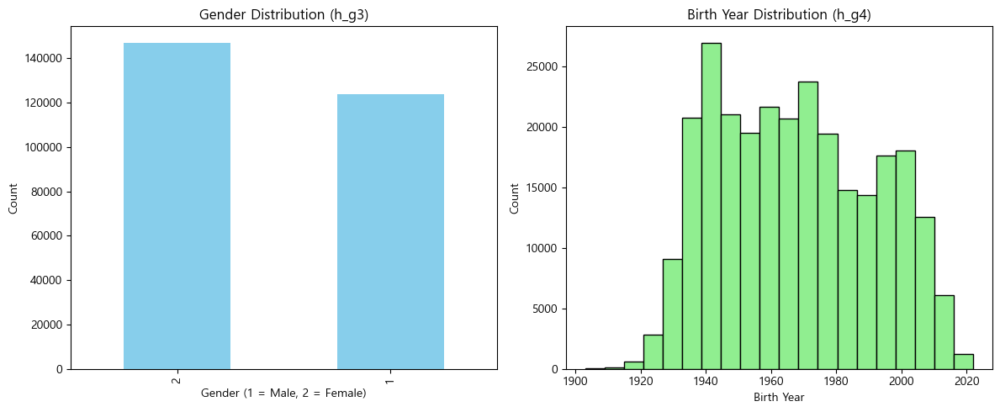

In [12]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
df['h_g3'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Gender Distribution (h_g3)')
plt.xlabel('Gender (1 = Male, 2 = Female)')
plt.ylabel('Count')

# Plotting the distribution for 'h_g4' (birth year)
plt.subplot(1, 2, 2)
df['h_g4'].plot(kind='hist', bins=20, color='lightgreen', edgecolor='black')
plt.title('Birth Year Distribution (h_g4)')
plt.xlabel('Birth Year')
plt.ylabel('Count')

plt.tight_layout()
plt.show()

C:\Users\james\AppData\Local\Temp\ipykernel_15100\1452244480.py:15: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(


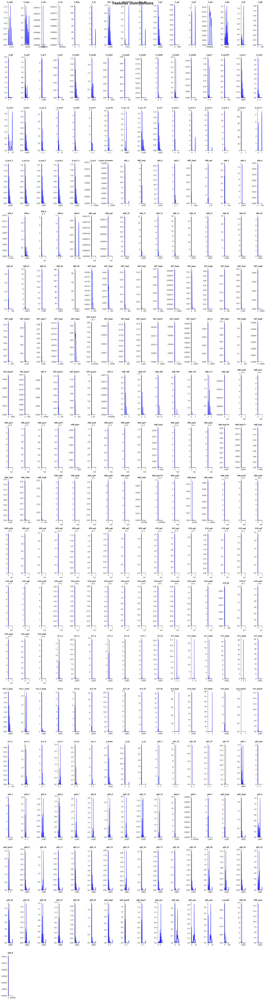

In [29]:
# 그래프 크기 설정
figsize = (20, 80)  
fig = plt.figure(figsize=figsize)

# 플롯의 행과 열 개수 설정
num_rows = 20  
num_cols_per_row = 16  

# 모든 수치형 변수의 분포를 그릴 변수 목록
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns

# 각 변수에 대해 KDE 플롯 생성
for idx, col in enumerate(numeric_cols):
    ax = plt.subplot(num_rows, num_cols_per_row, idx + 1)  # 플롯 배치 설정
    sns.kdeplot(
        data=df, fill=True, x=col, color='blue', legend=False  # KDE 플롯에서 hue 제거
    )
    
    # 플롯 스타일 설정
    ax.set_ylabel('')  # y축 레이블 비움
    ax.spines['top'].set_visible(False)  # 상단 축 숨김
    ax.set_xlabel('')  # x축 레이블 비움
    ax.spines['right'].set_visible(False)  # 우측 축 숨김
    ax.set_title(f'{col}', loc='right', weight='bold', fontsize=10)  # 제목 설정

# 전체 타이틀 설정
fig.suptitle(f'Features Distributions\n\n\n', ha='center', fontweight='bold', fontsize=21)

plt.tight_layout()  # 레이아웃 자동 조정
plt.show()  # 그래프 출력


In [21]:
# h_din 열에서 결측치를 가진 행 출력
missing_h_din_rows = df[df['h_med3'].isnull()]

# 해당 행 출력
missing_h_din_rows

,h_reg5,h_reg7,h_din,h_cin,h_flag,h_hc,h01_1,h01_110,h_hc_all,h_g1,h_g2,h_g3,h_g4,h_g6,h_g7,h_g8,h_g9,h_g10,h_g11,h_g12,h_med1,h_med2,h_med3,h_med4,h_med5,h_med6,h_med7,h_med8,h_g9_1,h_med10,h_eco1,h_eco2,h_eco4,h_soc1,h_soc_2,h_soc8,h_soc9,h_soc11,h_soc10,h_soc_12,h_soc_13,h_inc1,h_inc2_1,h_inc3_1,h_inc4_1,h_inc5_1,h_inc6_1,h_inc7_1,h_inc2_3,h_inc3_6,h_inc4_7,h_inc4_8,h_inc7_3,h_inc7,h_pers_income4,h05_1,h05_3aq1,h05_4,h05_7,h05_3aq2,h06_aq1,h06_1,h06_2,h06_4,h06_5,h06_3,h06_6,h06_8,h06_9,h06_aq2,h06_aq3,h06_10,h06_11,h06_12,h06_13,h06_14,h06_21,h06_22,h06_23,h06_24,h06_25,h06_27,h06_33,h06_36,h06_39,h07_3aq1,h07_3aq2,h07_5aq1,h07_3aq3,h07_3aq4,h07_3aq5,h07_6aq1,h07_3aq6,h07_5aq2,h07_3aq7,h07_3aq8,h07_3aq9,h07_3aq10,h07_3aq11,h07_5aq3,h07_5aq4,h07_3aq13,h07_6aq4,h07_6aq6,h07_3aq14,h07_3aq15,h07_3aq16,h07_3aq17,h07_4,h07_6aq7,h07_6aq8,h07_6aq9,h07_6aq10,h07_6aq11,h07_5,h07_6aq12,h07_6aq13,h07_6aq14,h07_9,h08_106,h08_107,h08_108,h08_109,h08_110,h08_111,h08_aq9,h08_aq10,h08_aq11,h08_aq12,h08_aq13,h08_aq14,h08_aq15,h08_6aq1,h08_aq16,h08_aq19,h08_aq20,h08_aq21,h08_5aq3,h08_aq22,h08_aq23,h08_aq24,h08_4aq116,h08_4aq117,h08_5aq1,h08_7aq4,h08_7aq6,h08_7aq8,h08_aq25,h08_aq26,h08_aq27,h08_aq28,h08_aq29,h08_3aq5,h08_4aq118,h08_aq30,h08_6aq3,h08_3aq6,h08_3aq7,h08_aq32,h08_aq33,h08_aq34,h09_aq1,h09_aq2,h09_aq3,h09_aq4,h09_aq5,h09_aq6,h09_aq7,h09_aq8,h10_aq1,h10_aq2,h10_aq3,h10_aq4,h10_aq5,h10_aq6,h10_aq7,h10_aq8,h10_aq9,h10_aq10,h10_aq11,h10_aq12,h10_aq13,h10_aq14,h10_aq15,h10_aq16,h10_aq17,h10_aq18,h10_aq19,h10_aq20,h10_26,h10_27,h10_aq23,h10_aq24,h10_aq25,h10_aq26,h11_2,h11_3,h11_4,h11_5,h11_6,h11_7,h11_8,h11_3aq1,h11_3aq2,h11_3aq3,h11_3aq4,h11_3aq6,h11_3aq7,h12_1_4aq1,h12_1_5aq1,h12_1_4aq2,h13_2,h13_6,h13_10,h13_14,h13_18,h13_22,h13_26,h13_8aq1,h13_5aq1,h13_8aq2,h13_4aq1,h13_4aq15,h13_4aq16,h17_1,h17_3,h17_4,h17_5,h17_6,h17_7,p_fnum,p_tq,p_cp,p01_1,p01_15,p01_20,p01_27,p01_31,p02_1,p02_aq2,p03_1,p03_2,p03_5,p03_6,p03_7,p03_8,p03_9,p03_10,p03_11,p03_12,p04_4,p04_5,p04_7,p05_3aq5,p05_3aq9,p05_2,p05_3aq11,p05_9,p05_10,p05_11,p05_12,p05_13,p05_14,p05_15,p05_16,p05_17,p05_18,p05_19,p05_20,p05_21,p05_22,p05_23,p05_24,p05_25,p05_26,p05_27,p05_28,p05_29,p05_4aq9,p05_4aq10,p05_4aq11,p05_aq1,p05_aq2,p05_aq3,p05_aq4,h_med9,h06_30,h06_3aq1,h09_9
171088,3,5,795.0,795.0,0.0,2.0,1,1,2.0,1,10,2,1932,3,5,0,0,2,2.0,1.0,1,4,NaN,0,0.0,0,2,1.0,3,0.0,1,3,9.0,1,0,0,0,0,0.0,4,2.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,2.0,0.0,0.0,2.0,1,3,1,33.0,5,NaN,NaN,NaN,NaN,NaN,NaN,2,2,2,1,1,1,1,1,4,2.0,2.0,2.0,2.0,21.0,2.0,0.0,0.0,0.0,8.0,4.1,0.4,0.0,0.0,17.0,0.0,0.0,1.0,5.0,4.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,60.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0,0,0,0,0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0.0,0.0,0.0,3.0,0.0,0.0,370.0,0.0,0.0,158.0,3000,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,200.0,0.0,0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0,0.0,0,0,0.0,0.0,3,2,2,3,2,2,1,2.0,3.0,3.0,2.0,2.0,2.0,1.0,4.0,1.0,1,1,2,1,2,2,2,2.0,2.0,2.0,2.0,NaN,2.0,0.0,1,1,4,1,1,1.0,3.0,1.0,2.0,2.0,2.0,2.0,2.0,4.0,0.0,2.0,0.0,2.0,2.0,3.0,3.0,3.0,3.0,3.0,3.0,2.0,NaN,2.0,2.0,1.0,5.0,2.0,2.0,3.0,2.0,2.0,2.0,1.0,4.0,1.0,2.0,1.0,1.0,1.0,2.0,3.0,1.0,3.0,2.0,2.0,2.0,3.0,3.0,0.0,0.0,0.0,4.0,0.0,4.0,4.0,NaN,2.0,2.0,NaN
255657,2,7,2153.0,2177.0,0.0,NaN,2,5,2.0,2,20,2,1933,3,5,0,0,1,2.0,1.0,2,4,NaN,1,15.0,1,1,1.0,3,0.0,2,3,9.0,2,0,0,0,0,0.0,4,2.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,2.0,2.0,2.0,2.0,0.0,0.0,1.0,1.0,2.0,0.0,0.0,2.0,2,3,2,66.0,1,25000.0,1.0,NaN,0.0,0.0,1.0,1,2,2,1,1,1,1,1,5,2.0,2.0,2.0,2.0,30.0,13.0,0.0,0.0,0.0,3.0,0.2,10.0,0.0,3.0,45.0,0.0,0.0,2.0,2.0,4.0,62.0,33.3,0.0,0.0,0.0,0.0,0.0,2.0,0.0,2.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,176.0,0.0,0.0,0.0,0.0,0.0,2.0,60.0,960,0,0,0,0,0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0.0,0.0,0.0,4.0,0.0,0.0,607.0,0.0,0.0,123.0,0,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,4400.0,0.0,0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0,0.0,0,0,0.0,0.0,3,2,2,3,2,2,2,2.0,3.0,3.0,2.0,2.0,2.0,1.0,4.0,1.0,1,1,2,2,2,2,2,2.0,2

In [22]:
# h_din 열에서 결측치를 가진 행 삭제
df.dropna(subset=['h_med3'], inplace=True)

df.shape

(270940, 289)

In [23]:
# h_din 열에서 결측치를 가진 행 출력
missing_h_din_rows = df[df['h_med5'].isnull()]

# 해당 행 출력
missing_h_din_rows

,h_reg5,h_reg7,h_din,h_cin,h_flag,h_hc,h01_1,h01_110,h_hc_all,h_g1,h_g2,h_g3,h_g4,h_g6,h_g7,h_g8,h_g9,h_g10,h_g11,h_g12,h_med1,h_med2,h_med3,h_med4,h_med5,h_med6,h_med7,h_med8,h_g9_1,h_med10,h_eco1,h_eco2,h_eco4,h_soc1,h_soc_2,h_soc8,h_soc9,h_soc11,h_soc10,h_soc_12,h_soc_13,h_inc1,h_inc2_1,h_inc3_1,h_inc4_1,h_inc5_1,h_inc6_1,h_inc7_1,h_inc2_3,h_inc3_6,h_inc4_7,h_inc4_8,h_inc7_3,h_inc7,h_pers_income4,h05_1,h05_3aq1,h05_4,h05_7,h05_3aq2,h06_aq1,h06_1,h06_2,h06_4,h06_5,h06_3,h06_6,h06_8,h06_9,h06_aq2,h06_aq3,h06_10,h06_11,h06_12,h06_13,h06_14,h06_21,h06_22,h06_23,h06_24,h06_25,h06_27,h06_33,h06_36,h06_39,h07_3aq1,h07_3aq2,h07_5aq1,h07_3aq3,h07_3aq4,h07_3aq5,h07_6aq1,h07_3aq6,h07_5aq2,h07_3aq7,h07_3aq8,h07_3aq9,h07_3aq10,h07_3aq11,h07_5aq3,h07_5aq4,h07_3aq13,h07_6aq4,h07_6aq6,h07_3aq14,h07_3aq15,h07_3aq16,h07_3aq17,h07_4,h07_6aq7,h07_6aq8,h07_6aq9,h07_6aq10,h07_6aq11,h07_5,h07_6aq12,h07_6aq13,h07_6aq14,h07_9,h08_106,h08_107,h08_108,h08_109,h08_110,h08_111,h08_aq9,h08_aq10,h08_aq11,h08_aq12,h08_aq13,h08_aq14,h08_aq15,h08_6aq1,h08_aq16,h08_aq19,h08_aq20,h08_aq21,h08_5aq3,h08_aq22,h08_aq23,h08_aq24,h08_4aq116,h08_4aq117,h08_5aq1,h08_7aq4,h08_7aq6,h08_7aq8,h08_aq25,h08_aq26,h08_aq27,h08_aq28,h08_aq29,h08_3aq5,h08_4aq118,h08_aq30,h08_6aq3,h08_3aq6,h08_3aq7,h08_aq32,h08_aq33,h08_aq34,h09_aq1,h09_aq2,h09_aq3,h09_aq4,h09_aq5,h09_aq6,h09_aq7,h09_aq8,h10_aq1,h10_aq2,h10_aq3,h10_aq4,h10_aq5,h10_aq6,h10_aq7,h10_aq8,h10_aq9,h10_aq10,h10_aq11,h10_aq12,h10_aq13,h10_aq14,h10_aq15,h10_aq16,h10_aq17,h10_aq18,h10_aq19,h10_aq20,h10_26,h10_27,h10_aq23,h10_aq24,h10_aq25,h10_aq26,h11_2,h11_3,h11_4,h11_5,h11_6,h11_7,h11_8,h11_3aq1,h11_3aq2,h11_3aq3,h11_3aq4,h11_3aq6,h11_3aq7,h12_1_4aq1,h12_1_5aq1,h12_1_4aq2,h13_2,h13_6,h13_10,h13_14,h13_18,h13_22,h13_26,h13_8aq1,h13_5aq1,h13_8aq2,h13_4aq1,h13_4aq15,h13_4aq16,h17_1,h17_3,h17_4,h17_5,h17_6,h17_7,p_fnum,p_tq,p_cp,p01_1,p01_15,p01_20,p01_27,p01_31,p02_1,p02_aq2,p03_1,p03_2,p03_5,p03_6,p03_7,p03_8,p03_9,p03_10,p03_11,p03_12,p04_4,p04_5,p04_7,p05_3aq5,p05_3aq9,p05_2,p05_3aq11,p05_9,p05_10,p05_11,p05_12,p05_13,p05_14,p05_15,p05_16,p05_17,p05_18,p05_19,p05_20,p05_21,p05_22,p05_23,p05_24,p05_25,p05_26,p05_27,p05_28,p05_29,p05_4aq9,p05_4aq10,p05_4aq11,p05_aq1,p05_aq2,p05_aq3,p05_aq4,h_med9,h06_30,h06_3aq1,h09_9
35065,4,7,1493.0,1541.0,0.0,2.0,2,5,2.0,2,20,2,1952,3,5,2,3,1,1.0,1.0,2,5,1.0,5,NaN,1,1,0.0,3,0.0,2,4,9.0,2,0,0,0,0,0.0,4,2.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,2.0,2.0,2.0,2.0,0.0,0.0,1.0,1.0,2.0,0.0,0.0,2.0,1,3,2,76.0,1,1500.0,1.0,NaN,0.0,0.0,1.0,1,1,2,1,1,1,1,1,4,2.0,2.0,2.0,2.0,17.0,0.6,0.9,0.0,0.0,8.0,4.8,2.0,0.0,0.5,74.0,0.0,0.0,0.8,21.0,5.0,12.0,1.7,0.8,0.0,0.0,2.0,0.0,4.0,0.0,0.1,3.3,0.0,0.0,0.0,0.0,0.0,0.0,148.0,0.0,0.0,0.0,0.0,0.0,2.0,60.0,28,0,212,0,0,0,0.0,48.0,0,0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,20.0,17.0,68.0,0,0,0,0.0,0.0,0.0,4.0,0.0,0.0,610.0,0.0,0.0,16.0,0,0,0,0,0,0.0,0.0,0.0,0,0,500,0,0,5013.0,0.0,0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,1,800.0,0,1500,0.0,0.0,3,2,2,3,2,2,2,2.0,3.0,3.0,2.0,2.0,2.0,1.0,4.0,1.0,1,1,2,1,2,2,2,2.0,2.0,2.0,2.0,NaN,1.0,4.0,1,1,4,1,1,2.0,3.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,2.0,NaN
57503,2,3,880.8,882.0,0.0,2.0,1,1,2.0,1,10,1,1933,3,5,0,0,2,2.0,1.0,1,5,26.0,1,NaN,1,7,0.0,3,0.0,1,4,9.0,1,0,0,0,0,0.0,4,5.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,2.0,NaN,NaN,NaN,0.0,2.0,6,3,2,43.0,3,180.0,1.0,NaN,0.0,0.0,1.0,1,1,2,1,1,1,1,1,7,1.0,2.0,2.0,2.0,32.0,0.0,0.0,6.0,4.0,4.0,2.7,2.0,0.0,0.3,12.0,0.0,0.0,0.7,3.0,3.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,73.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0,0,0,0,0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,18.0,14.0,23.0,0,0,0,0.0,0.0,0.0,3.0,0.0,0.0,230.0,0.0,0.0,39.0,0,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0,0.0,0,0,0.0,0.0,2,2,2,3,2,2,2,3.0,3.0,2.0,2.0,2.0,2.0,1.0,4.0,1.0,1,1,1,1,1,2,2,

In [24]:
# h_din 열에서 결측치를 가진 행 삭제
df.dropna(subset=['h_med5'], inplace=True)

df.shape

(270936, 289)

In [25]:
# 결측치가 11개 이하인 열들을 선택
few_missing_cols = df.columns[df.isnull().sum() <= 11]

# p04_4가 1이 아닌 행들 삭제
df = df[df['p04_4'] == 1]

# 결측치가 11개 이하인 열을 삭제 (다시 할 필요가 없다면 skip 가능)
df.drop(columns=few_missing_cols, inplace=True)
df.shape

(19463, 161)

In [ ]:
# 영어 변수와 한국어 변수의 매핑
variable_mapping = {
    'h_reg5': '5개 권역별 지역구분',
    'h_reg7': '7개 권역별 지역구분',
    'h_din': '가처분소득',
    'h_cin': '경상소득',
    'h_flag': '가처분소득 및 경상소득 - Imputation 여부',
    'h_hc': '가구원수',
    'h01_1': '가구형태',
    'h01_110': '균등화소득에 따른 가구구분 (공공부조 이전의 균등화 경상소득의 중위 60% 기준)(원표본)',
    'h_hc_all': '가구원수 (전체)',
    'h_g1': '가구주와의 관계',
    'h_g2': '성별',
    'h_g3': '태어난 연도',
    'h_g4': '교육수준1',
    'h_g6': '장애종류',
    'h_g7': '장애등급(정도)',
    'h_g8': '혼인상태',
    'h_g9': '종교(15차에서 일시 삭제)',
    'h_g10': '동거여부',
    'h_med1': '건강상태',
    'h_med2': '1년간 의료기관 이용 외래진료횟수',
    'h_med3': '입원횟수',
    'h_med4': '입원일수',
    'h_med5': '병원에 입원한 이유',
    'h_med6': '주로 이용하는 의료기관 형태',
    'h_med7': '건강검진 횟수',
    'h_med8': '만성질환',
    'h_med9': '민간의료보험 가입건수',
    'h_eco1': '근로 능력 정도',
    'h_eco2': '주된 경제활동 참여상태',
    'h_soc1': '고용보험가입여부',
    'h_soc_2': '산재보험가입여부',
    'h_soc8': '건강보험 가입여부',
    'h_soc9': '상용근로자 해당여부',
    'h_inc1': '연간 총급여액 (상용근로자)',
    'h_inc2_1': '연간 순소득 (임시일용)',
    'h_inc3_1': '연간 전입소득 (고용주)',
    'h_inc4_1': '연간 기타 근로소득 (기타)',
    'p04_4': '지난해 기부 금액 1',
    'p04_5': '지난해 기부 금액 2',
    'p_fnum': '가구원 번호',
    'p_tq': '건강보험 가입 여부',
    'p_cp': '건강보험료 미납 경험',
    'p03_1': '1년간 이사경험 여부',
    'p03_2': '주택유형',
    'p03_5': '주거위치',
    'p03_6': '방수',
    'p03_7': '주거면적',
    'p03_8': '집의 (등기상) 점유형태',
    'p03_9': '집의 가격',
    'p03_10': '주택구입비용, 보증금 마련 경로(1순위)',
    'p03_11': '주택구입비용, 보증금 마련 경로(2순위)',
    'p03_12': '1년간 총 원금상환액(가)',
    'p03_13': '12월 31일 기준 주택관련 부채액(나)',
    'p03_14': '1년간 대출상환액 연체횟수',
    'p03_15': '주택의 구조, 성능 및 환경(가)',
    'p03_16': '주택의 구조, 성능 및 환경(나)',
    'p03_17': '주택의 구조, 성능 및 환경(다)',
    'p03_18': '주택의 구조, 성능 및 환경(라)',
    'p03_19': '주거시설 사용형태_상하수도',
    'p03_20': '주거시설 사용형태_부엌',
    'p03_21': '주거시설 사용형태_화장실',
    'p03_22': '주거시설 사용형태_목욕시설',
    'p03_23': '주거시설 사용형태_난방시설',
    'p03_24': '주거복지사업 이용경험_공공임대주택',
    'p03_25': '주거복지사업 이용경험_전세자금(융자)지원',
    'p03_26': '주거복지사업 이용경험_월세지원',
    'p03_27': '주거복지사업 이용경험_주택구입자금(융자)지원',
    'p04_6': '식료품비-가정식비',
    'p04_7': '식료품비-외식비',
    'p04_8': '식료품비-주류ㆍ담배비',
    'p04_9': '주거비-월세',
    'p04_10': '주거비-주거관리비',
    'p04_11': '광열수도비',
    'p04_12': '광열수도비-난방비',
    'p04_13': '가구가사용품비-가구집기ㆍ가사용품비',
    'p04_14': '가구가사용품비-보육료비',
    'p04_15': '피복신발비',
    'p04_16': '보건의료비',
    'p04_17': '교육비-공교육비',
    'p04_18': '교육비-사교육비',
    'p04_19': '교양오락비',
    'p04_20': '교통비',
    'p04_21': '통신비',
    'p04_22': '기타소비지출',
    'p04_23': '기타소비-경조비',
    'p04_24': '기타소비-종교관련비(십일조)',
    'p04_25': '비동거가구원에게 보낸 월평균 송금보조비',
    'p04_26': '부모에게 보낸 월평균 송금보조비',
    'p04_27': '자녀에게 보낸 월평균 송금보조비',
    'p04_28': '기타 가구원이 아닌 부모‧자녀‧친지에게 보낸 월평균 송금보조비',
    'p05_1': '세금',
    'p05_2': '세금-소득세',
    'p05_3': '세금-재산세',
    'p05_4': '세금-자동차세',
    'p05_5': '세금-종합소득세',
    'p05_6': '세금-부동산세',
    'p05_7': '사회보장부담금',
    'p05_8': '사회보장부담-국민연금보험료',
    'p05_9': '사회보장부담-건강보험료',
    'p05_10': '사회보장부담-고용보험료',
}

# 매핑된 변수명을 df에 적용
df = df.rename(columns=variable_mapping)

# 매핑된 변수를 출력 (선택 사항)
print(df.head())


In [7]:
# 결측치를 0으로 대체
df.fillna(0, inplace=True)
df.head()

,h_cobf,h_reg5,h_reg7,h_din,h_cin,h_flag,h_hc,h01_1,h01_110,h_hc_all,...,p04_3aq5,p04_3aq6,p04_3aq7,p04_3aq8,h09_9,h08_3aq8,h08_195,h12_1,h12_7,h08_aq17
1,0,1,1,858.8,896.0,0,2,1,1,2,...,5,1,1,1,50,0,0,2,1,109
2,0,1,1,1260.8,1310.0,0,2,1,1,2,...,4,2,4,2,50,0,0,2,1,113
3,0,1,1,2172.0,2208.0,0,1,1,1,1,...,3,2,2,2,80,0,0,2,1,116
4,0,1,1,864.0,864.0,0,2,1,1,2,...,2,1,1,1,50,0,0,2,1,59
5,0,1,1,1159.0,1171.0,0,2,1,1,2,...,4,2,4,2,50,0,0,2,1,0


In [8]:
# 데이터프레임 전체를 float으로 변환
df = df.apply(pd.to_numeric, errors='coerce').fillna(0).astype(float)

In [10]:
df.to_csv(r"C:\Users\james\J DATA LAB\Project-DonationPrediction\data\koweps_prep7.csv")

In [4]:
# 파일 불러오기
file_path = r"C:\Users\james\J DATA LAB\Project-DonationPrediction\data\koweps_prep6.csv"
df = pd.read_csv(file_path)
df.head()

,Unnamed: 0,h_cobf,h_reg5,h_reg7,h_din,h_cin,h_flag,h_hc,h01_1,h01_110,...,p04_3aq5,p04_3aq6,p04_3aq7,p04_3aq8,h09_9,h08_3aq8,h08_195,h12_1,h12_7,h08_aq17
0,0,0.0,1.0,1.0,858.8,896.0,0.0,1.0,1.0,5.0,...,5.0,1.0,1.0,1.0,50.0,0.0,0.0,2.0,1.0,0.0
1,1,0.0,1.0,1.0,1260.8,1310.0,0.0,1.0,1.0,5.0,...,4.0,2.0,4.0,2.0,50.0,0.0,0.0,2.0,1.0,0.0
2,2,0.0,1.0,1.0,2172.0,2208.0,0.0,1.0,1.0,5.0,...,3.0,2.0,2.0,2.0,80.0,0.0,0.0,2.0,1.0,0.0
3,3,0.0,1.0,1.0,864.0,864.0,0.0,1.0,1.0,5.0,...,2.0,1.0,1.0,1.0,50.0,0.0,0.0,2.0,1.0,0.0
4,4,0.0,1.0,1.0,1159.0,1171.0,0.0,1.0,1.0,5.0,...,4.0,2.0,4.0,2.0,50.0,0.0,0.0,2.0,1.0,0.0


In [5]:
df = df.drop(columns='Unnamed: 0')
df.head()

,h_cobf,h_reg5,h_reg7,h_din,h_cin,h_flag,h_hc,h01_1,h01_110,h_hc_all,...,p04_3aq5,p04_3aq6,p04_3aq7,p04_3aq8,h09_9,h08_3aq8,h08_195,h12_1,h12_7,h08_aq17
0,0.0,1.0,1.0,858.8,896.0,0.0,1.0,1.0,5.0,2.0,...,5.0,1.0,1.0,1.0,50.0,0.0,0.0,2.0,1.0,0.0
1,0.0,1.0,1.0,1260.8,1310.0,0.0,1.0,1.0,5.0,2.0,...,4.0,2.0,4.0,2.0,50.0,0.0,0.0,2.0,1.0,0.0
2,0.0,1.0,1.0,2172.0,2208.0,0.0,1.0,1.0,5.0,1.0,...,3.0,2.0,2.0,2.0,80.0,0.0,0.0,2.0,1.0,0.0
3,0.0,1.0,1.0,864.0,864.0,0.0,1.0,1.0,5.0,2.0,...,2.0,1.0,1.0,1.0,50.0,0.0,0.0,2.0,1.0,0.0
4,0.0,1.0,1.0,1159.0,1171.0,0.0,1.0,1.0,5.0,2.0,...,4.0,2.0,4.0,2.0,50.0,0.0,0.0,2.0,1.0,0.0


In [6]:
# summary table 
def summary(df):
    print(f'data shape: {df.shape}')
    summ = pd.DataFrame(df.dtypes, columns=['data type'])
    summ['#missing'] = df.isnull().sum().values 
    summ['%missing'] = df.isnull().sum().values / len(df)* 100
    summ['#unique'] = df.nunique().values
    desc = pd.DataFrame(df.describe(include='all').transpose())
    summ['min'] = desc['min'].values
    summ['max'] = desc['max'].values
    summ['mean'] = desc['mean'].values
    summ['first quartile'] = desc.loc[:, '25%'].values
    summ['second quartile'] = desc.loc[:, '50%'].values
    summ['third quartile'] = desc.loc[:, '75%'].values
    
    return summ

In [9]:
# 모든 열을 표시할 수 있도록 설정 변경
pd.set_option('display.max_columns', None)  # 모든 열을 표시
pd.set_option('display.max_rows', None)     # 모든 행을 표시

# summary 함수 실행
summary_df = summary(df)
summary_df

data shape: (270949, 153)


,data type,#missing,%missing,#unique,min,max,mean,first quartile,second quartile,third quartile
h_reg5,float64,0,0.0,4,1.0,4.000000,2.595846,2.000000,3.000000,3.000000
h_reg7,float64,0,0.0,7,1.0,7.000000,3.673374,2.000000,3.000000,5.000000
h_din,float64,0,0.0,22065,-4201.0,12017.000000,4007.614132,1887.000000,3538.000000,5610.000000
h_cin,float64,0,0.0,13026,-4466.0,13384.000000,4343.572306,1972.000000,3770.000000,6098.000000
h01_1,float64,0,0.0,7,1.0,7.000000,3.062314,2.000000,3.000000,4.000000
h_hc_all,float64,0,0.0,3,0.0,2.000000,0.870795,0.000000,1.000000,1.000000
h_g1,float64,0,0.0,6,1.0,6.000000,2.028205,1.000000,2.000000,3.000000
h_g2,float64,0,0.0,30,1.0,35.000000,12.842284,10.000000,11.000000,20.000000
h_g3,float64,0,0.0,2,1.0,2.000000,1.542822,1.000000,2.000000,2.000000
h_g4,float64,0,0.0,118,1903.0,2022.000000,1967.576706,1947.000000,1966.000000,1988.000000


In [ ]:
h_g2, h_g8, h_g12, 9999999, 999999, 99999,9999, 999, 99

In [15]:
def unique_value_counts(df, column_name):
    # 해당 컬럼의 유니크 값과 빈도수 출력
    unique_counts = df[column_name].value_counts()
    return unique_counts

unique_value_counts(df, 'h10_27')

h10_27
0.0          115270
300.0          7456
500.0          7027
200.0          6920
100.0          6183
1000.0         6100
400.0          5307
1500.0         4922
800.0          4918
600.0          4636
50.0           4399
700.0          4241
1200.0         3691
150.0          3668
2000.0         3562
1300.0         2857
250.0          2830
900.0          2783
350.0          2533
1800.0         2446
450.0          2419
2500.0         2316
1100.0         2291
1400.0         1897
1600.0         1862
1700.0         1756
3000.0         1604
650.0          1564
550.0          1502
750.0          1365
30.0           1338
2300.0         1213
850.0          1148
2200.0         1106
1900.0          991
80.0            940
2800.0          938
950.0           868
3500.0          867
2100.0          828
2400.0          815
4000.0          756
180.0           754
2700.0          746
120.0           679
2600.0          643
70.0            639
60.0            620
1050.0          616
1250.0       

In [16]:
# 대체할 값 목록
replace_values = [9999999, 999999, 99999, 9999, 999, 99]

# 값들을 0으로 대체
df.replace(replace_values, 0, inplace=True)

In [8]:
# 값이 1개만 존재하는 변수(컬럼) 삭제
df = df.loc[:, df.nunique() > 1]
df.head()

,h_reg5,h_reg7,h_din,h_cin,h01_1,h_hc_all,h_g1,h_g2,h_g3,h_g4,h_g6,h_g7,h_g10,h_g11,h_med1,h_med2,h_med3,h_med8,h_g9_1,h_med10,h_eco1,h_eco4,h_soc1,h_soc_2,h_soc8,h_soc9,h_soc11,h_soc10,h_soc_12,h_soc_13,h_inc1,h_inc7_1,h_inc2_3,h_inc3_6,h_inc4_7,h_inc4_8,h_inc7_3,h05_3aq1,h05_3aq2,h06_1,h06_4,h06_5,h06_3,h06_6,h06_9,h07_3aq1,h07_3aq2,h07_5aq1,h07_3aq4,h07_3aq5,h07_6aq1,h07_3aq6,h07_3aq7,h07_3aq8,h07_3aq9,h07_3aq10,h07_3aq11,h07_5aq3,h07_5aq4,h07_3aq13,h07_6aq4,h07_6aq6,h07_3aq15,h07_4,h07_6aq7,h07_6aq8,h07_6aq9,h07_5,h07_6aq12,h07_6aq13,h07_6aq14,h07_9,h08_106,h08_107,h08_111,h08_aq9,h08_aq12,h08_aq30,h08_3aq6,h08_3aq7,h08_aq34,h09_aq1,h10_aq6,h10_aq7,h10_26,h10_27,h11_2,h11_5,h12_1_4aq1,h12_1_5aq1,h13_2,h13_6,h13_8aq1,h13_8aq2,h13_4aq1,h17_1,h17_2,h17_3,h17_5,h17_6,p_fnum,p01_1,p02_1,p03_1,p03_2,p03_5,p03_6,p03_7,p03_8,p03_9,p03_10,p03_11,p03_12,p04_4,p04_5,p04_7,p05_3aq5,p05_3aq9,p05_2,p05_3aq11,p05_10,p05_11,p05_12,p05_13,p05_15,p05_20,p05_21,p05_22,p05_23,p05_24,p05_25,p05_26,p05_27,p05_4aq9,p05_4aq10,p05_4aq11,p05_aq1,p05_aq2,p05_aq3,p05_aq4,p05_7aq1,h_med9,p04_3aq1,p04_3aq2,p04_3aq3,p04_3aq4,p04_3aq5,p04_3aq6,p04_3aq7,p04_3aq8,h09_9,h12_1,h12_7
0,1.0,1.0,858.8,896.0,1.0,2.0,1.0,10.0,2.0,1936.0,2.0,0.0,2.0,2.0,1.0,3.0,6.0,1.0,3.0,0.0,1.0,9.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,3.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,0.0,2.0,2.0,3.713572,2.0,8.517393,2.0,3.135494,0.693147,0.0,1.0,7.0,4.4,2.0,0.8,14.0,0.0,0.0,7.0,2.0,3.0,2.397895,0.7,0.0,0.0,0.1,0.0,0.0,0.0,3.0,0.0,2.7,0.0,4.304065,0.0,0.0,1.0,0.0,0.0,4.0,0.0,0.0,20.0,0.0,3.044522,2.833213,0.0,0.0,2.0,3.0,1.0,2.0,1.0,1.0,0.0,0.0,2.0,0.0,0.0,2.0,4.0,2.0,1.0,2.0,4.0,2.0,0.0,2.0,3.0,4.0,4.0,3.0,4.0,4.0,4.0,2.0,0.0,2.0,2.0,1.0,5.0,2.0,4.0,1.0,1.0,2.0,4.0,3.0,3.0,1.0,2.0,2.0,3.0,2.0,2.0,0.0,0.0,0.0,6.0,0.0,6.0,3.0,2.0,9.0,5.0,4.0,2.0,2.0,5.0,1.0,1.0,1.0,50.0,2.0,1.0
1,1.0,1.0,1260.8,1310.0,1.0,2.0,1.0,10.0,2.0,1936.0,2.0,0.0,2.0,2.0,1.0,4.0,11.0,1.0,3.0,0.0,1.0,9.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,3.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,0.0,2.0,2.0,3.931826,2.0,8.294300,88.0,3.433987,1.098612,0.0,10.0,9.0,3.5,2.0,3.0,28.0,0.0,0.0,1.0,3.0,3.0,2.079442,1.6,0.0,0.0,0.1,0.0,0.0,0.0,4.0,0.0,3.5,0.0,4.634729,0.0,0.0,1.0,0.0,0.0,3.0,0.0,0.0,2.0,0.0,7.003974,5.416100,0.0,0.0,2.0,3.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,4.0,0.0,2.0,3.0,2.0,1.0,2.0,4.0,2.0,0.0,2.0,3.0,3.0,4.0,3.0,3.0,3.0,3.0,2.0,0.0,2.0,2.0,1.0,5.0,2.0,2.0,1.0,2.0,2.0,4.0,1.0,3.0,2.0,2.0,3.0,3.0,1.0,2.0,0.0,0.0,0.0,6.0,0.0,6.0,6.0,2.0,12.0,4.0,4.0,4.0,2.0,4.0,2.0,4.0,2.0,50.0,2.0,1.0
2,1.0,1.0,2172.0,2208.0,1.0,1.0,1.0,10.0,2.0,1936.0,2.0,0.0,2.0,2.0,1.0,2.0,6.0,0.0,3.0,0.0,1.0,9.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,3.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,2.0,2.0,3.526361,2.0,8.294300,88.0,2.397895,0.000000,0.0,0.1,8.0,2.0,2.0,1.0,8.0,0.0,0.0,2.0,1.0,4.0,1.791759,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,3.0,0.0,5.214936,0.0,0.0,1.0,0.0,0.0,4.0,0.0,0.0,6.0,0.0,3.931826,0.000000,0.0,0.0,2.0,3.0,1.0,2.0,1.0,1.0,2.0,2.0,2.0,7.0,0.0,2.0,2.0,3.0,1.0,2.0,5.0,2.0,0.0,1.0,3.0,2.0,4.0,3.0,4.0,3.0,3.0,2.0,0.0,2.0,2.0,1.0,5.0,2.0,2.0,1.0,1.0,1.0,1.0,3.0,1.0,1.0,2.0,2.0,3.0,3.0,2.0,0.0,0.0,0.0,6.0,0.0,6.0,6.0,2.0,9.0,2.0,4.0,4.0,4.0,3.0,2.0,2.0,2.0,80.0,2.0,1.0
3,1.0,1.0,864.0,864.0,1.0,2.0,1.0,10.0,2.0,1936.0,2.0,0.0,2.0,2.0,1.0,3.0,6.0,0.0,3.0,0.0,1.0,9.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,4.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,0.0,2.0,2.0,3.526361,2.0,8.517393,88.0,3.178054,1.386294,0.0,0.0,8.0,5.0,3.0,4.0,16.0,0.0,0.0,1.0,1.0,2.0,2.639057,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.317488,0.0,0.0,1.0,0.0,0.0,3.0,0.0,0.0,3.0,0.0,4.615121,0.000000,0.0,0.0,2.0,3.0,1.0,2.0,1.0,1.0,2.0,2.0,2.0,7.0,0.0,2.0,3.0,1.0,1.0,2.0,4.0,2.0,0.0,2.0,3.0,3.0,4.0,3.0,2.0,3.0,3.0,2.0,0.0,2.0,2.0,1.0,5.0,2.0,4.0,1.0,2.0,1.0,4.0,2.0,3.0,3.0,1.0,2.0,2.0,1.0,2.0,0.0,0.0,0.0,4.0,0.0,5.0,1.0,2.0,8.0,4.0,4.0,5.0,4.0,2.0,1.0,1.0,1.0,50.0,2.0,1.0
4,1.0,1.0,1159.0,1171.0,1.0,2.0,1.0,10.0,2.0,1936.0,2.0,0.0,2.0,1.0,1.0,4.0,6.0,0.0,3.0,0.0,1.0,9.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,3.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,

In [30]:
# 수치형 변수 리스트 추출
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns

# 수치형 변수 리스트에서 'p04_5'를 제외
numerical_cols_excluded = [col for col in numerical_cols if col != 'p04_5']

# 이상치 탐지 및 처리 함수 정의 (IQR 방법)
def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # 이상치를 NaN으로 대체
    df[column] = df[column].apply(lambda x: x if lower_bound <= x <= upper_bound else np.nan)
    # NaN을 해당 변수의 중앙값으로 대체
    df[column].fillna(df[column].median(), inplace=True)

# 'p04_5'를 제외한 모든 수치형 변수에 적용
for col in numerical_cols_excluded:
    remove_outliers_iqr(df, col)


In [34]:
# 로그 변환 대상 변수 리스트
log_transform_cols = ['h06_5', 'h06_6', 'h07_3aq1', 'h07_3aq2', 'h07_3aq13', 'h07_9', 'h09_aq1', 'h10_aq6', 'h10_aq7']

# 로그 변환 적용
for col in log_transform_cols:
    df[col] = np.log1p(df[col])

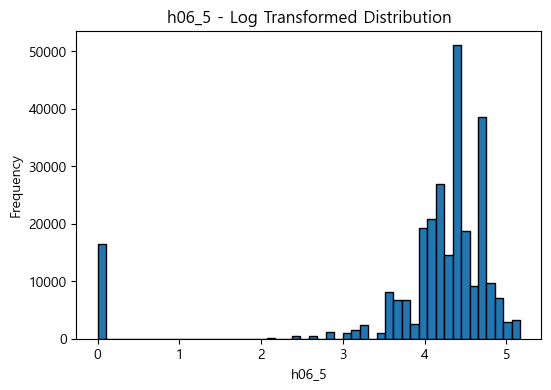

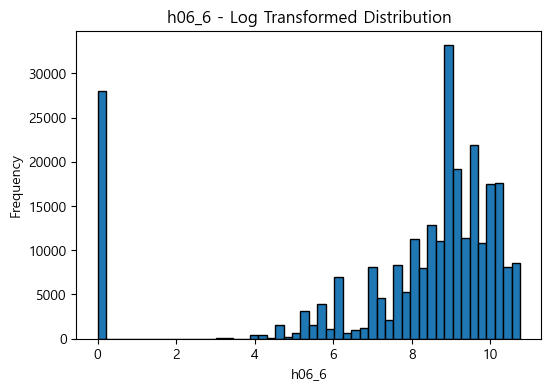

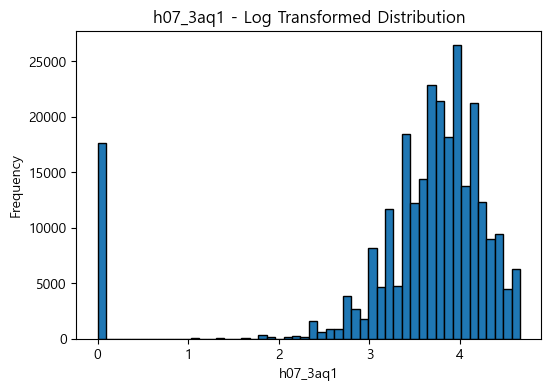

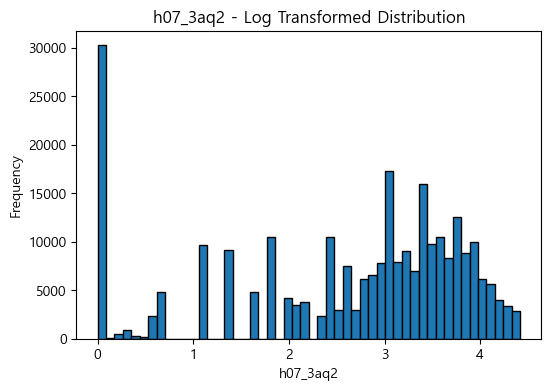

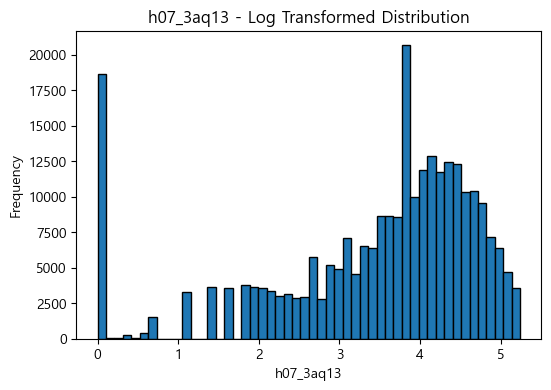

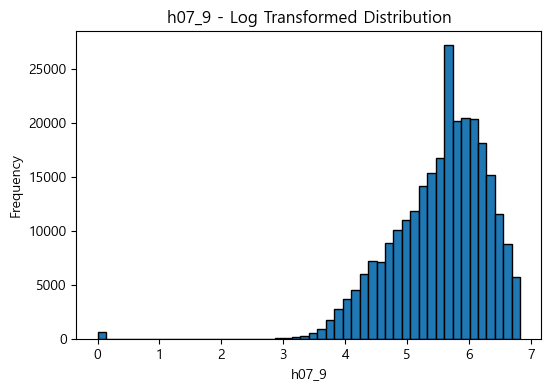

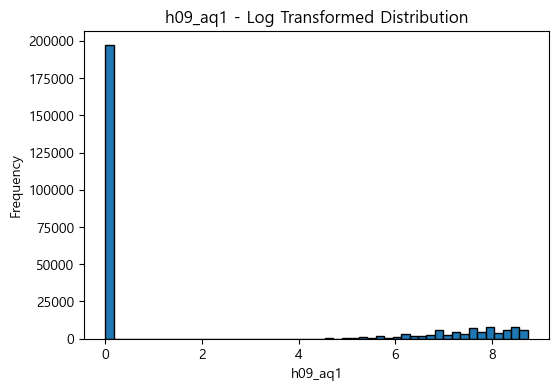

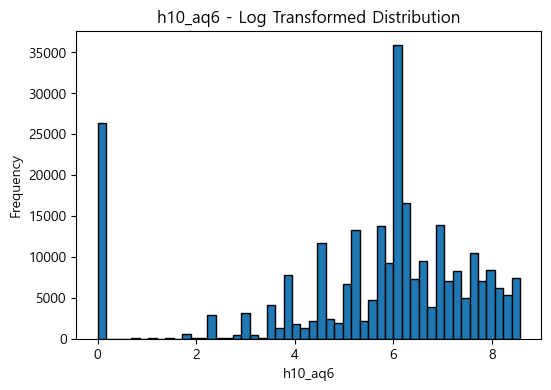

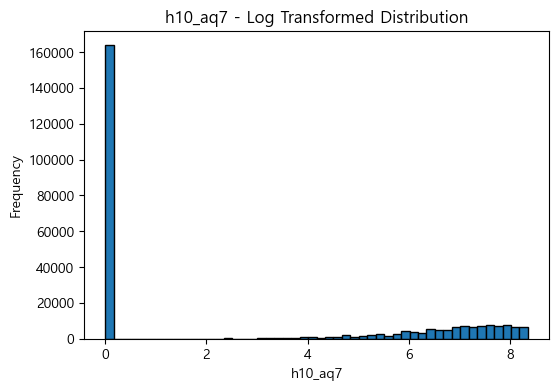

In [35]:
import matplotlib.pyplot as plt

# 변환된 변수의 분포 시각화
for col in log_transform_cols:
    plt.figure(figsize=(6, 4))
    plt.hist(df[col], bins=50, edgecolor='k')
    plt.title(f'{col} - Log Transformed Distribution')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()


In [36]:
# 모든 열을 표시할 수 있도록 설정 변경
pd.set_option('display.max_columns', None)  # 모든 열을 표시
pd.set_option('display.max_rows', None)     # 모든 행을 표시

# summary 함수 실행
summary_df = summary(df)
summary_df

data shape: (270949, 317)


,data type,#missing,%missing,#unique,min,max,mean,first quartile,second quartile,third quartile
h_cobf,float64,0,0.0,1,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
h_reg5,float64,0,0.0,4,1.0,4.000000,2.595846,2.000000,3.000000,3.000000
h_reg7,float64,0,0.0,7,1.0,7.000000,3.673374,2.000000,3.000000,5.000000
h_din,float64,0,0.0,22065,-4201.0,12017.000000,4007.614132,1887.000000,3538.000000,5610.000000
h_cin,float64,0,0.0,13026,-4466.0,13384.000000,4343.572306,1972.000000,3770.000000,6098.000000
h_flag,float64,0,0.0,1,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
h_hc,float64,0,0.0,1,1.0,1.000000,1.000000,1.000000,1.000000,1.000000
h01_1,float64,0,0.0,7,1.0,7.000000,3.062314,2.000000,3.000000,4.000000
h01_110,float64,0,0.0,1,5.0,5.000000,5.000000,5.000000,5.000000,5.000000
h_hc_all,float64,0,0.0,3,0.0,2.000000,0.870795,0.000000,1.000000,1.000000


In [ ]:
# 로그 변환이 필요한 변수 리스트 (예시)
log_transform_cols = ['h07_3aq13', 'h07_9', 'h09_aq1', 'h09_aq2', 'h09_aq3', 'h09_aq4']

for col in log_transform_cols:
    df[col] = np.log1p(df[col])


In [19]:
# CFG 클래스 정의
class CFG:
    VER = 1
    AUTHOR = 'datawizardd'
    COMPETITION = 'donation-prediction'
    DATA_PATH = Path(r'C:\Users\james\J DATA LAB\Project-DonationPrediction\data\koweps_check6.csv')
    OOF_DATA_PATH = Path('./oof')
    MODEL_DATA_PATH = Path('./models')
    METHOD_LIST = ['logistic_regression', 'random_forest', 'lightgbm', 'xgboost', 'catboost', 'mlp', 'cnn']
    seed = 3407
    n_folds = 3  
    target_col = 'donation'
    metric = 'balanced_log_loss'
    metric_maximize_flag = False
    num_boost_round = 1000  
    early_stopping_round = 50  
    verbose = 1000  
    boosting_type = 'gbdt'  

    # 기존 모델 파라미터 
    logistic_regression_params = {
        'penalty': 'l2',
        'C': 1.0,
        'solver': 'lbfgs',
        'random_state': seed,
        'max_iter': 1000,
    }

    random_forest_params = {
        'n_estimators': 100,
        'criterion': 'gini',
        'max_depth': None,
        'min_samples_split': 2,
        'min_samples_leaf': 1,
        'random_state': seed,
        'n_jobs': -1,
        'class_weight': 'balanced',
    }

    lgb_params = {
        'objective': 'binary',
        'metric': 'binary_logloss',
        'boosting': boosting_type,
        'device_type': 'cpu',
        'learning_rate': 0.01,
        'num_leaves': 15,
        'max_depth': 7,
        'feature_fraction': 0.50,
        'bagging_fraction': 0.80,
        'lambda_l1': 2, 
        'lambda_l2': 4,
        'n_jobs': -1,
        'is_unbalance': True,
        'verbose': -1,
        'seed': seed,
    }

    xgb_params = {
        'objective': 'binary:logistic',
        'eval_metric': 'logloss',
        'learning_rate': 0.01,
        'max_depth': 4,
        'colsample_bytree': 0.50,
        'subsample': 0.80,
        'eta': 0.03,
        'gamma': 1.5,
        'random_state': seed,
    }

    cat_params = {
        'learning_rate': 0.01,
        'iterations': 1000,
        'depth': 4,
        'colsample_bylevel': 0.50,
        'subsample': 0.80,
        'l2_leaf_reg': 3,
        'random_seed': seed,
        'auto_class_weights': 'Balanced',
    }

    
    mlp_params = {
        'hidden_layer_sizes': (100,),
        'activation': 'relu',
        'solver': 'adam',
        'alpha': 0.0001,
        'batch_size': 'auto',
        'learning_rate': 'constant',
        'learning_rate_init': 0.001,
        'max_iter': 200,
        'shuffle': True,
        'random_state': seed,
        'tol': 1e-4,
        'verbose': False,
        'warm_start': False,
        'momentum': 0.9,
        'nesterovs_momentum': True,
        'early_stopping': False,
        'validation_fraction': 0.1,
        'beta_1': 0.9,
        'beta_2': 0.999,
        'epsilon': 1e-8,
    }

    
    cnn_params = {
        'input_shape': None,  
        'num_conv_layers': 2,
        'filters': 32,
        'kernel_size': 3,
        'activation': 'relu',
        'dropout_rate': 0.5,
        'dense_units': 64,
        'learning_rate': 0.001,
        'batch_size': 32,
        'epochs': 50,
        'verbose': 0,
    }

NameError: name 'Path' is not defined

In [7]:
METHOD_LIST = ['logistic_regression', 'random_forest', 'lightgbm', 'xgboost', 'catboost', 'mlp', 'cnn']

In [8]:
df['donation'] = None

# p04_4가 1인 경우
df.loc[df['p04_4'] == 1, 'donation'] = df['p04_5'].apply(lambda x: 1 if x >= 1 else 0)
# p04_4가 2인 경우
df.loc[df['p04_4'] == 2, 'donation'] = 0
# 나머지 경우 삭제 또는 결측치 처리
df = df.dropna(subset=['donation'])

# p04_4에서 1을 선택하고 p04_5에서 1 이하를 적은 사람 삭제
df = df[~((df['p04_4'] == 1) & ((df['p04_5'] <= 1) | (df['p04_5'].isna())))]

# 결측치 제거 (None 값이 있는 행 삭제)
df = df.dropna(subset=['donation'])

# 종속변수(y)와 독립변수(x) 설정
y = df['donation'].astype(int)
x = df.drop(columns=['p04_4', 'p04_5', 'donation'])

# 데이터 분리 
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=CFG.seed)

In [9]:
# 0과 1의 비율
fig2 = px.pie(df, names='donation', 
              height=400, width=600, 
              hole=0.7, 
              title='기부자 분포',
              color_discrete_sequence=['#4c78a8', '#72b7b2'])

fig2.update_traces(hovertemplate=None, textposition='outside', textinfo='percent+label', rotation=0)
fig2.update_layout(margin=dict(t=100, b=30, l=0, r=0), showlegend=False,
                   plot_bgcolor='#fafafa', paper_bgcolor='#fafafa',
                   title_font=dict(size=20, color='#555', family="Lato, sans-serif"),
                   font=dict(size=17, color='#8a8d93'),
                   hoverlabel=dict(bgcolor="#444", font_size=13, font_family="Lato, sans-serif"))

fig2.show()

In [10]:
# donation 컬럼을 int로 변환
df['donation'] = df['donation'].astype('int64')

In [5]:
summary(df)

data shape: (289801, 287)


,data type,#missing,%missing,#unique,min,max,first quartile,second quartile,third quartile
h_cobf,int64,0,0.0,2,0.0,1.0,0.0,0.0,0.0
h_reg5,int64,0,0.0,5,1.0,5.0,2.0,3.0,3.0
h_reg7,int64,0,0.0,7,1.0,7.0,2.0,3.0,5.0
h_din,float64,0,0.0,24545,-239088.0,451181.0,1806.0,3519.0,5801.0
h_cin,float64,0,0.0,15301,-232174.0,468209.0,1888.0,3765.0,6361.0
...,...,...,...,...,...,...,...,...,...
h08_3aq8,int64,0,0.0,14,0.0,1665.0,0.0,0.0,0.0
h08_195,float64,0,0.0,1169,0.0,999999.0,0.0,0.0,0.0
h12_1,int64,0,0.0,2,1.0,2.0,1.0,2.0,2.0
h12_7,int64,0,0.0,6,0.0,5.0,0.0,1.0,1.0


In [11]:
num_cols = x_train.select_dtypes(include=[np.number]).columns.tolist()
cat_cols = x_train.select_dtypes(exclude=[np.number]).columns.tolist()

C:\Users\james\AppData\Local\Temp\ipykernel_9852\2486159444.py:8: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.

C:\Users\james\AppData\Local\Temp\ipykernel_9852\2486159444.py:8: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.

C:\Users\james\AppData\Local\Temp\ipykernel_9852\2486159444.py:8: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.



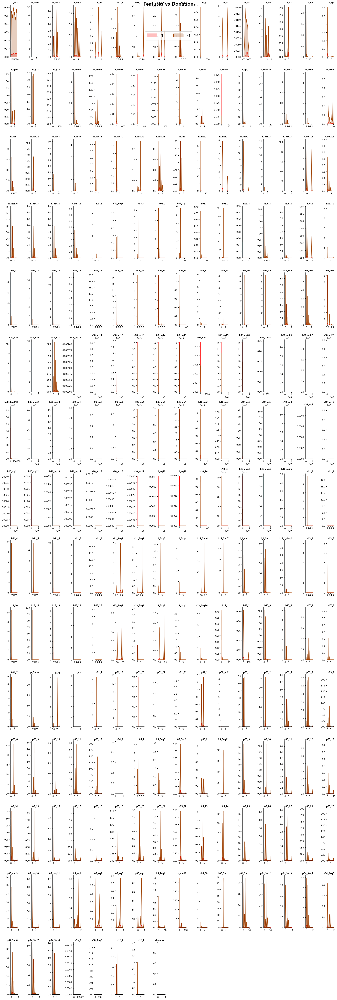

In [35]:
figsize = (20, 80)  
fig = plt.figure(figsize=figsize)
num_rows = 20  
num_cols_per_row = 16  

for idx, col in enumerate(num_cols):
    ax = plt.subplot(num_rows, num_cols_per_row, idx + 1) 
    sns.kdeplot(
        data=df, hue='donation', fill=True,
        x=col, palette=['#9E3F00', 'red'], legend=False
    )
            
    ax.set_ylabel(''); ax.spines['top'].set_visible(False)
    ax.set_xlabel(''); ax.spines['right'].set_visible(False)
    ax.set_title(f'{col}', loc='right', weight='bold', fontsize=10)

fig.suptitle(f'Features vs Donation\n\n\n', ha='center', fontweight='bold', fontsize=21)
fig.legend([1, 0], loc='upper center', bbox_to_anchor=(0.5, 0.96), fontsize=21, ncol=3)
plt.tight_layout()
plt.show()

In [12]:
def plot_top_correlations(df: pd.core.frame.DataFrame, n: int, title_name: str='Top Correlations') -> None:
    
    numeric_df = df.select_dtypes(include=[np.number])
    corr = numeric_df.corr()

    # 상관관계의 절대값이 가장 높은 상위 n개의 변수 선택
    top_corr_cols = corr.abs().unstack().sort_values(ascending=False).drop_duplicates().nlargest(n).index.get_level_values(0)
    top_corr = corr.loc[top_corr_cols, top_corr_cols]

    # 상관관계 히트맵 그리기
    fig, ax = plt.subplots(figsize=(10, 5))
    mask = np.zeros_like(top_corr)
    mask[np.triu_indices_from(mask)] = True
    sns.heatmap(top_corr, mask=mask, linewidths=.5, cmap='YlOrRd', annot=True, ax=ax)
    plt.title(title_name)
    plt.show()


plot_top_correlations(df[num_cols], 20, 'Top 20 Correlations in Dataset')

NameError: name 'num_cols' is not defined

In [12]:
# 전처리 함수 정의 및 적용
def Preprocessing(x_train: pd.DataFrame, x_test: pd.DataFrame, num_cols: list):
    sc = StandardScaler()
    x_train[num_cols] = sc.fit_transform(x_train[num_cols])
    x_test[num_cols] = sc.transform(x_test[num_cols])
    return x_train, x_test

x_train, x_test = Preprocessing(x_train, x_test, num_cols)

# 각종 함수 정의

In [13]:
# 시드 고정 함수
def seed_everything(seed):
    random.seed(seed)
    np.random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)

seed_everything(CFG.seed)

In [14]:
# 성능 평가 함수
def evaluate_model_performance(y_true, y_pred, y_pred_proba):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    specificity = tn / (tn + fp)
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    accuracy = accuracy_score(y_true, y_pred)
    auc = roc_auc_score(y_true, y_pred_proba)
    return {
        'Precision': precision,
        'Recall': recall,
        'Specificity': specificity,
        'F1-score': f1,
        'Accuracy': accuracy,
        'AUC': auc
    }

In [15]:
# Balanced Log Loss 함수
def balanced_log_loss(y_true, y_pred):
    y_pred = np.clip(y_pred, 1e-15, 1-1e-15)
    nc = np.bincount(y_true)
    w0, w1 = 1/(nc[0]/y_true.shape[0]), 1/(nc[1]/y_true.shape[0])
    balanced_log_loss_score = (-w0/nc[0]*(np.sum(np.where(y_true==0,1,0) * np.log(1-y_pred))) - w1/nc[1]*(np.sum(np.where(y_true!=0,1,0) * np.log(y_pred)))) / (w0 + w1)
    return balanced_log_loss_score

def calc_log_loss_weight(y_true):
    nc = np.bincount(y_true)
    w0, w1 = 1/(nc[0]/y_true.shape[0]), 1/(nc[1]/y_true.shape[0])
    return w0, w1

In [16]:
# LightGBM 학습 함수
def lightgbm_training(x_train, y_train, x_valid, y_valid, num_cols, cat_cols):
    train_w0, train_w1 = calc_log_loss_weight(y_train)
    valid_w0, valid_w1 = calc_log_loss_weight(y_valid)
    lgb_train = lgb.Dataset(x_train, y_train, weight=y_train.map({0: train_w0, 1: train_w1}), categorical_feature=cat_cols)
    lgb_valid = lgb.Dataset(x_valid, y_valid, weight=y_valid.map({0: valid_w0, 1: valid_w1}), categorical_feature=cat_cols)
    model = lgb.train(
        params=CFG.lgb_params,
        train_set=lgb_train,
        num_boost_round=CFG.num_boost_round,
        valid_sets=[lgb_train, lgb_valid],
        early_stopping_rounds=CFG.early_stopping_round,
        verbose_eval=CFG.verbose,
    )
    valid_pred = model.predict(x_valid, num_iteration=model.best_iteration)
    return model, valid_pred

In [17]:
# XGBoost 학습 함수
def xgboost_training(x_train, y_train, x_valid, y_valid, num_cols, cat_cols):
    train_w0, train_w1 = calc_log_loss_weight(y_train)
    valid_w0, valid_w1 = calc_log_loss_weight(y_valid)
    
    # DMatrix 생성
    xgb_train = xgb.DMatrix(data=x_train, label=y_train, weight=y_train.map({0: train_w0, 1: train_w1}))
    xgb_valid = xgb.DMatrix(data=x_valid, label=y_valid, weight=y_valid.map({0: valid_w0, 1: valid_w1}))
    
    evals_result = {}
    
    # 모델 학습
    model = xgb.train(
        CFG.xgb_params, 
        dtrain=xgb_train, 
        num_boost_round=CFG.num_boost_round, 
        evals=[(xgb_train, 'train'), (xgb_valid, 'eval')], 
        early_stopping_rounds=CFG.early_stopping_round, 
        evals_result=evals_result,
        verbose_eval=CFG.verbose,
    )
    
    # `ntree_limit` 인자 없이 예측 수행
    valid_pred = model.predict(xgb_valid)
    
    return model, valid_pred

In [18]:
# CatBoost 학습 함수
def catboost_training(x_train, y_train, x_valid, y_valid, num_cols, cat_cols):
    train_w0, train_w1 = calc_log_loss_weight(y_train)
    valid_w0, valid_w1 = calc_log_loss_weight(y_valid)
    cat_train = Pool(data=x_train, label=y_train, weight=y_train.map({0: train_w0, 1: train_w1}), cat_features=cat_cols)
    cat_valid = Pool(data=x_valid, label=y_valid, weight=y_valid.map({0: valid_w0, 1: valid_w1}), cat_features=cat_cols)
    model = CatBoostClassifier(**CFG.cat_params)
    model.fit(cat_train, 
              eval_set=[cat_valid],
              early_stopping_rounds=CFG.early_stopping_round, 
              verbose=CFG.verbose, 
              use_best_model=True)
    valid_pred = model.predict_proba(x_valid)[:, 1]
    return model, valid_pred

In [19]:
# MLP 학습 함수
def mlp_training(x_train, y_train, x_valid, y_valid, num_cols, cat_cols):
    model = MLPClassifier(**CFG.mlp_params)
    model.fit(x_train, y_train)
    valid_pred_proba = model.predict_proba(x_valid)[:, 1]
    return model, valid_pred_proba

In [20]:
# CNN 학습 함수
def cnn_training(x_train, y_train, x_valid, y_valid, num_cols, cat_cols):
    # 입력 데이터 형태 변환: (samples, features, 1)
    x_train_cnn = x_train.values.reshape(-1, x_train.shape[1], 1)
    x_valid_cnn = x_valid.values.reshape(-1, x_valid.shape[1], 1)
    
    # CNN 모델 정의
    def create_cnn_model():
        model = Sequential()
        model.add(Conv1D(filters=CFG.cnn_params['filters'],
                         kernel_size=CFG.cnn_params['kernel_size'],
                         activation=CFG.cnn_params['activation'],
                         input_shape=(x_train.shape[1], 1)))
        for _ in range(CFG.cnn_params['num_conv_layers'] - 1):
            model.add(Conv1D(filters=CFG.cnn_params['filters'],
                             kernel_size=CFG.cnn_params['kernel_size'],
                             activation=CFG.cnn_params['activation']))
        model.add(Flatten())
        model.add(Dropout(CFG.cnn_params['dropout_rate']))
        model.add(Dense(CFG.cnn_params['dense_units'], activation=CFG.cnn_params['activation']))
        model.add(Dense(1, activation='sigmoid'))
        
        model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=CFG.cnn_params['learning_rate']),
                      loss='binary_crossentropy',
                      metrics=['AUC'])
        return model

    model = create_cnn_model()
    
    # 조기 종료 콜백 설정
    early_stop = EarlyStopping(monitor='val_loss', patience=CFG.early_stopping_round, restore_best_weights=True)
    
    # 모델 학습
    history = model.fit(
        x_train_cnn, y_train,
        validation_data=(x_valid_cnn, y_valid),
        epochs=CFG.cnn_params['epochs'],
        batch_size=CFG.cnn_params['batch_size'],
        callbacks=[early_stop],
        verbose=CFG.cnn_params['verbose']
    )
    
    # 검증 예측 확률
    valid_pred_proba = model.predict(x_valid_cnn).ravel()
    
    return model, valid_pred_proba

# 모델링 평가

In [21]:
# Gradient Boosting 모델 학습 함수
def gradient_boosting_model_cv_training(method: str, x: pd.DataFrame, y: pd.Series, num_cols: list, performance_list: list):
    oof_predictions = np.zeros(len(x))
    oof_fold = np.zeros(len(x))
    kfold = StratifiedKFold(n_splits=CFG.n_folds, shuffle=True, random_state=CFG.seed)
    
    for fold, (train_index, valid_index) in enumerate(kfold.split(x, y)):
        print('-' * 50)
        print(f'{method} training fold {fold + 1}')
        
        x_train_fold = x.iloc[train_index]
        y_train_fold = y.iloc[train_index]
        x_valid_fold = x.iloc[valid_index]
        y_valid_fold = y.iloc[valid_index]

        if method == 'logistic_regression':
            model = LogisticRegression(**CFG.logistic_regression_params)
            model.fit(x_train_fold, y_train_fold)
            valid_pred_proba = model.predict_proba(x_valid_fold)[:, 1]
        elif method == 'random_forest':
            model = RandomForestClassifier(**CFG.random_forest_params)
            model.fit(x_train_fold, y_train_fold)
            valid_pred_proba = model.predict_proba(x_valid_fold)[:, 1]
        elif method == 'lightgbm':
            model, valid_pred_proba = lightgbm_training(x_train_fold, y_train_fold, x_valid_fold, y_valid_fold, num_cols, cat_cols)
        elif method == 'xgboost':
            model, valid_pred_proba = xgboost_training(x_train_fold, y_train_fold, x_valid_fold, y_valid_fold, num_cols, cat_cols)
        elif method == 'catboost':
            model, valid_pred_proba = catboost_training(x_train_fold, y_train_fold, x_valid_fold, y_valid_fold, num_cols, cat_cols)
        elif method == 'mlp':
            model, valid_pred_proba = mlp_training(x_train_fold, y_train_fold, x_valid_fold, y_valid_fold, num_cols, cat_cols)
        elif method == 'cnn':
            model, valid_pred_proba = cnn_training(x_train_fold, y_train_fold, x_valid_fold, y_valid_fold, num_cols, cat_cols)
        else:
            raise ValueError(f"Unknown method: {method}")

        valid_pred = (valid_pred_proba > 0.5).astype(int) # 임계값 수정 가능
        oof_predictions[valid_index] = valid_pred_proba
        oof_fold[valid_index] = fold + 1

        # 모델 저장
        if method != 'cnn':
            # CNN을 제외한 모델은 pickle로 저장
            pickle.dump(model, open(CFG.MODEL_DATA_PATH / f'{method}_fold{fold + 1}_seed{CFG.seed}_ver{CFG.VER}.pkl', 'wb'))
        else:
            # CNN 모델은 Keras의 save 메서드 사용
            model.save(CFG.MODEL_DATA_PATH / f'{method}_fold{fold + 1}_seed{CFG.seed}_ver{CFG.VER}.h5')
        
        # 메모리 정리
        del x_train_fold, x_valid_fold, y_train_fold, y_valid_fold, model, valid_pred, valid_pred_proba
        gc.collect()
    
    # 성능 지표 계산
    performance_metrics = evaluate_model_performance(y, (oof_predictions > 0.5).astype(int), oof_predictions)
    print(f'{method} Performance Metrics:')
    for metric_name, metric_value in performance_metrics.items():
        print(f'{metric_name}: {metric_value:.4f}')
    
    # 성능 지표 리스트에 추가
    performance_metrics['Algorithm'] = method
    performance_list.append(performance_metrics)

In [22]:
# 성능 지표를 저장할 리스트 초기화
performance_list = []

# 모델 학습 및 성능 지표 수집
for method in CFG.METHOD_LIST:
    gradient_boosting_model_cv_training(method, x_train, y_train, num_cols, performance_list)

# 성능 지표를 DataFrame으로 변환
performance_df = pd.DataFrame(performance_list)

# 'Algorithm' 컬럼을 첫 번째로 이동
cols = ['Algorithm'] + [col for col in performance_df.columns if col != 'Algorithm']
performance_df = performance_df[cols]

# 성능 지표 표 출력
print("\n모델별 성능 지표:")
performance_df

--------------------------------------------------
logistic_regression training fold 1
--------------------------------------------------
logistic_regression training fold 2
--------------------------------------------------
logistic_regression training fold 3
logistic_regression Performance Metrics:
Precision: 0.5033
Recall: 0.0752
Specificity: 0.9946
F1-score: 0.1309
Accuracy: 0.9325
AUC: 0.8415
--------------------------------------------------
random_forest training fold 1
--------------------------------------------------
random_forest training fold 2
--------------------------------------------------
random_forest training fold 3
random_forest Performance Metrics:
Precision: 0.6048
Recall: 0.0413
Specificity: 0.9980
F1-score: 0.0774
Accuracy: 0.9334
AUC: 0.8491
--------------------------------------------------
lightgbm training fold 1


C:\Users\james\anaconda3\envs\myenv\lib\site-packages\lightgbm\engine.py:181: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\james\anaconda3\envs\myenv\lib\site-packages\lightgbm\basic.py:2065: UserWarning:

Using categorical_feature in Dataset.

C:\Users\james\anaconda3\envs\myenv\lib\site-packages\lightgbm\engine.py:239: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[28]	training's binary_logloss: 0.673693	valid_1's binary_logloss: 0.673958
--------------------------------------------------
lightgbm training fold 2


C:\Users\james\anaconda3\envs\myenv\lib\site-packages\lightgbm\engine.py:181: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\james\anaconda3\envs\myenv\lib\site-packages\lightgbm\basic.py:2065: UserWarning:

Using categorical_feature in Dataset.

C:\Users\james\anaconda3\envs\myenv\lib\site-packages\lightgbm\engine.py:239: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[28]	training's binary_logloss: 0.673357	valid_1's binary_logloss: 0.674012
--------------------------------------------------
lightgbm training fold 3


C:\Users\james\anaconda3\envs\myenv\lib\site-packages\lightgbm\engine.py:181: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\james\anaconda3\envs\myenv\lib\site-packages\lightgbm\basic.py:2065: UserWarning:

Using categorical_feature in Dataset.

C:\Users\james\anaconda3\envs\myenv\lib\site-packages\lightgbm\engine.py:239: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[28]	training's binary_logloss: 0.67256	valid_1's binary_logloss: 0.673573
lightgbm Performance Metrics:
Precision: 0.0782
Recall: 0.9966
Specificity: 0.1483
F1-score: 0.1450
Accuracy: 0.2057
AUC: 0.7927
--------------------------------------------------
xgboost training fold 1
[0]	train-logloss:0.69077	eval-logloss:0.69081
[999]	train-logloss:0.44096	eval-logloss:0.46938
--------------------------------------------------
xgboost training fold 2
[0]	train-logloss:0.69081	eval-logloss:0.69087
[999]	train-logloss:0.44031	eval-logloss:0.47332
--------------------------------------------------
xgboost training fold 3
[0]	train-logloss:0.69075	eval-logloss:0.69082
[999]	train-logloss:0.44171	eval-logloss:0.47234
xgboost Performance Metrics:
Precision: 0.1930
Recall: 0.7914
Specificity: 0.7601
F1-score: 0.3103
Accuracy: 0.7622
AUC: 0.8555
--------------------------------------------------
catboost

KeyboardInterrupt: 

In [21]:
def find_best_threshold(y_true, y_pred_proba):
    precision, recall, thresholds = precision_recall_curve(y_true, y_pred_proba)
    
    f1_scores = 2 * (precision * recall) / (precision + recall)
    # nan 값을 무시
    valid_indices = ~np.isnan(f1_scores)
    if not np.any(valid_indices):
        raise ValueError("모든 F1-scores가 NaN입니다.")
    best_index = np.argmax(f1_scores[valid_indices])
    best_threshold = thresholds[best_index]
    best_f1 = f1_scores[best_index]
    return best_threshold, best_f1

In [22]:
model = xgb.XGBClassifier(**CFG.xgb_params)
model.fit(x_train, y_train)
y_pred_proba = model.predict_proba(x_test)[:, 1]

# 최적 임계값 찾기
best_threshold, best_f1 = find_best_threshold(y_test, y_pred_proba)
print(f"Best Threshold: {best_threshold}")
print(f"Best F1-Score: {best_f1}")

# 해당 임계값으로 예측 수행
y_pred = (y_pred_proba > best_threshold).astype(int)

# 성능 지표 계산
performance_metrics = evaluate_model_performance(y_test, y_pred, y_pred_proba)
print(f"XGBoost Performance Metrics at Threshold {best_threshold}:")
for metric_name, metric_value in performance_metrics.items():
    print(f"{metric_name}: {metric_value:.4f}")

Best Threshold: 0.1434536725282669
Best F1-Score: 0.3449363523712966
XGBoost Performance Metrics at Threshold 0.1434536725282669:
Precision: 0.2634
Recall: 0.4987
Specificity: 0.8985
F1-score: 0.3447
Accuracy: 0.8713
AUC: 0.8316


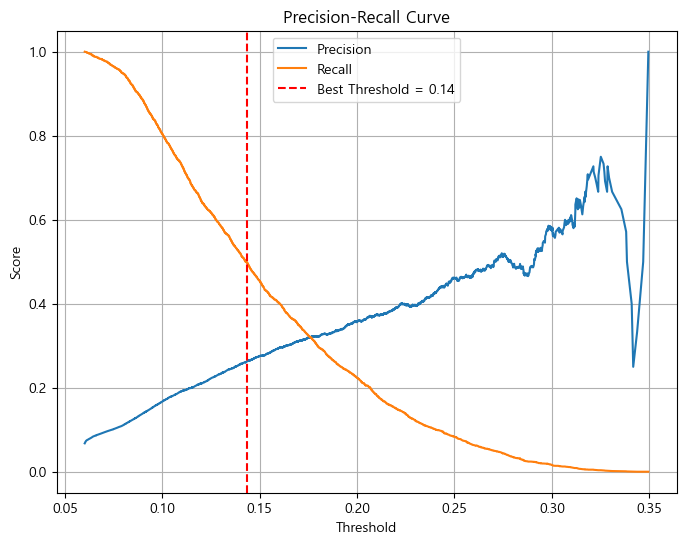

In [27]:
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)

plt.figure(figsize=(8, 6))
plt.plot(thresholds, precision[:-1], label='Precision')
plt.plot(thresholds, recall[:-1], label='Recall')
plt.axvline(x=best_threshold, color='red', linestyle='--', label=f'Best Threshold = {best_threshold:.2f}')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid(True)
plt.show()

# 전체 기부 특성 분석

In [21]:
# XGBoost 최종 모델 학습
final_xgb_model = xgb.XGBClassifier(**CFG.xgb_params)
final_xgb_model.fit(x_train, y_train)

# 예측 확률 수행
y_test_proba_final = final_xgb_model.predict_proba(x_test)[:, 1]

# 최적 임계값 적용 
y_test_pred_final = (y_test_proba_final > 0.152).astype(int)

# DataFrame 생성 
test_results = x_test.reset_index(drop=True).copy()
test_results['Actual'] = y_test.reset_index(drop=True)
test_results['Predicted'] = y_test_pred_final
test_results['Donation_Probability'] = y_test_proba_final

# 기부 확률이 높은 상위 20명
top_donors = test_results.sort_values(by='Donation_Probability', ascending=False).head(20)
print("\n기부 확률이 높은 상위 20명:")
top_donors


기부 확률이 높은 상위 20명:


,year,h_cobf,h_reg5,h_reg7,h_din,h_cin,h_hc,h01_1,h01_110,h_hc_all,...,p04_3aq8,h09_9,h08_3aq8,h08_195,h12_1,h12_7,h08_aq17,Actual,Predicted,Donation_Probability
25899,1.257439,-0.076054,0.322792,0.646804,7.119702,8.338657,-0.158313,-0.645015,0.443343,0.198897,...,0.725896,-0.087563,-0.109333,-0.009518,-1.250362,-1.118420,-0.008848,0,1,0.339717
9285,-0.661897,-0.076054,1.285745,1.132952,1.118745,1.335783,-0.158313,0.125256,0.443343,-1.160611,...,-0.141948,0.024764,-0.109333,-0.009518,0.781016,0.525457,-0.008848,1,1,0.336177
12761,-0.469963,-0.076054,-1.603115,-1.297791,2.322072,2.466742,-1.694335,0.895528,0.443343,0.198897,...,0.725896,0.126393,-0.109333,-0.009518,0.781016,0.525457,-0.008848,1,1,0.332551
14595,1.065506,-0.076054,-0.640161,-0.811643,2.045779,2.662764,-0.158313,1.665799,0.443343,0.198897,...,-1.009793,-0.087563,-0.109333,-0.009518,-1.250362,-1.118420,-0.008848,0,1,0.331894
1210,1.449373,-0.076054,0.322792,0.646804,4.367001,5.476101,-0.158313,-0.645015,0.443343,0.198897,...,-1.009793,-0.087563,-0.109333,-0.009518,-1.250362,-1.118420,-0.008848,1,1,0.328436
17356,0.873572,-0.076054,0.322792,1.619101,1.684054,2.019302,-0.158313,0.895528,0.443343,0.198897,...,-1.009793,-0.087563,-0.109333,-0.009518,-1.250362,-1.118420,-0.008848,1,1,0.327060
6076,0.873572,-0.076054,0.322792,1.619101,1.684054,2.019302,-0.158313,0.895528,0.443343,0.198897,...,-1.009793,-0.087563,-0.109333,-0.009518,-1.250362,-1.118420,-0.008848,1,1,0.325660
23937,0.297771,-0.076054,-0.640161,-0.325494,0.986733,1.188979,-0.158313,0.895528,0.443343,0.198897,...,-0.141948,0.072904,-0.109333,-0.009518,0.781016,0.525457,-0.008848,1,1,0.325442
20215,1.257439,-0.076054,0.322792,1.619101,2.108945,2.514895,-0.158313,0.895528,0.443343,0.198897,...,-0.141948,-0.087563,-0.109333,-0.009518,-1.250362,-1.118420,-0.008848,0,1,0.324163
24572,1.065506,-0.076054,0.322792,1.619101,1.799479,2.142880,-0.158313,0.895528,0.443343,0.198897,...,-1.009793,-0.087563,-0.109333,-0.009518,-1.250362,-1.118420,-0.008848,0,1,0.323887


# SHAP 분석

In [46]:
variable_mapping = {
    'h_eco1': '가구원번호',
    'h_soc_13': '건강보험 가입여부',
    'h_g6': '교육수준',
    'h_eco4': '주된 경제활동 참여상태',
    'h_med8': '건강검진 횟수',
    'h_g4': '태어난 연도',
    'h_med2': '건강상태',
    'h_g2': '가구주와의 관계',
    'h01_1': '가구원수',
    'h_g11': '종교',
    'p03_1': '인터넷 사용 여부',
    'p03_11': '여가생활만족도',
    'h_cin': '경상소득',
    'p05_26': '나에 대해 대체로 만족',
    'h_inc2_1': '상용근로자 해당여부',
    'p05_20': '나는 가치 있는 사람',
    'p05_25': '긍정적인 태도',
    'h07_3aq13': '기타소비지출',
    'h07_9': '총생활비',
    'h07_4': '세금',
    'h07_3aq11': '교양오락비',
    'h07_6aq6': '종교관련비(십일조)',
    'h07_5': '사회보장부담금',
    'h05_3aq2': '민간의료보험의 12월 기준 보험료',
    'h07_5aq1': '식료품비 - 주류 및 담배',
    'h08_6aq3': '세금환급금',
    'h10_aq7': '금융자산-적금',
    'p03_9': '직업 만족도',
    'h08_aq9': '이자, 배당금, 연간소득',
    'h10_27': '소유한 자동차 가격',
    'h08_aq34': '민간 개인 또는 단체로 부터 받은 보조금',
    'h17_1': '1년간 근심이나 갈등을 초래한 문제',
    'h07_3aq9': '교육비-공교육비',
    'h07_6aq7': '세금-소득세',
    'h07_6aq14': '사회보장부담-고용보험료',
    'h07_6aq13': '사회보장부담-건강보험료',
    'h06_4': '(주택)방수',
    'h07_3aq15': '부모에게 보낸 월평금 송금보조비',
    'h07_6aq8': '재산세',
    'h07_6aq1': '광열수도비- 난방비'
}

x_train_mapped = x_train.rename(columns=variable_mapping)
x_test_reset_mapped = x_test_reset.rename(columns=variable_mapping)

In [47]:
explainer = shap.Explainer(final_xgb_model, x_train_mapped)

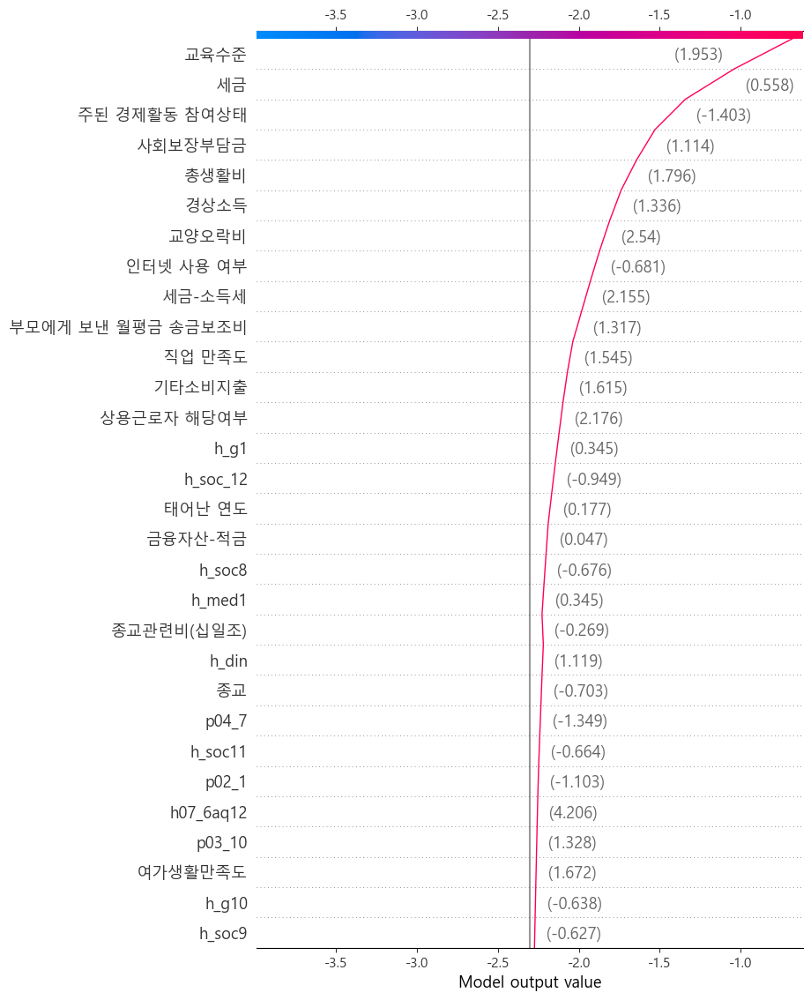

In [53]:
instance_index = 9285

if instance_index >= len(x_test_reset_mapped):
    print(f"Instance index {instance_index} is out of range for the test set with length {len(x_test_reset_mapped)}.")
else:

    instance = x_test_reset_mapped.iloc[[instance_index]]
    
    shap_values_instance = explainer(instance)
 
    shap.decision_plot(
        base_value=shap_values_instance.base_values[0],
        shap_values=shap_values_instance.values[0],
        features=instance.iloc[0],
        feature_display_range=slice(None, -31, -1)  
    )
    
    
    plt.show()

100%|===================| 45112/45197 [01:09<00:00]        

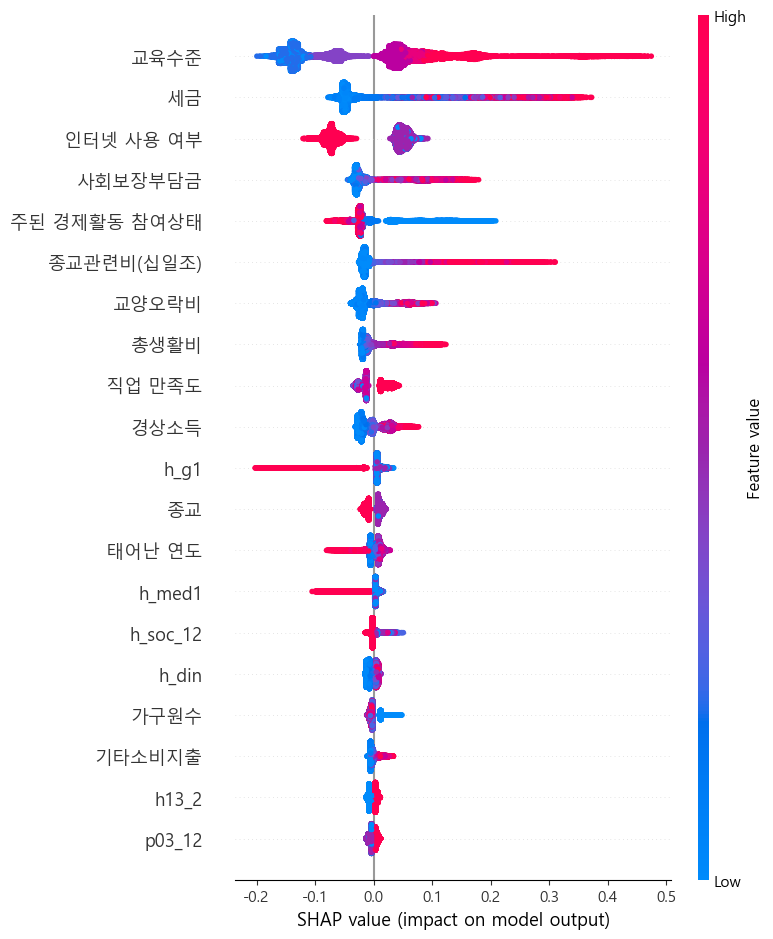

In [49]:
X_shap_mapped = x_test_reset_mapped  
shap_values = explainer(X_shap_mapped)
shap.summary_plot(shap_values, X_shap_mapped)